### INIZIALIZZAZIONE


In [ ]:
# Libraries and utilities

import math
import matplotlib
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image




from collections import defaultdict
from scipy.stats.stats import pearsonr

In [ ]:
# read dataset
ravdess_df=pd.read_csv('ravdess_features.csv')



###**DATA PREPARATION**

In [ ]:
for i,s in enumerate(ravdess_df['vocal_channel']):
  if s !='speech' and  s!= 'song':
    #print(s)
    if ravdess_df['length_ms'][i]>4100:
        ravdess_df['vocal_channel'][i] = 'song'
    else:
       ravdess_df['vocal_channel'][i] = 'speech'





/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [ ]:
ravdess_df.isnull().any()

modality               False
vocal_channel          False
emotion                False
emotional_intensity    False
statement              False
repetition             False
actor                   True
sex                    False
channels               False
sample_width           False
frame_rate             False
frame_width            False
length_ms              False
frame_count            False
intensity               True
zero_crossings_sum     False
mfcc_mean              False
mfcc_std               False
mfcc_min               False
mfcc_max               False
sc_mean                False
sc_std                 False
sc_min                 False
sc_max                 False
sc_kur                 False
sc_skew                False
stft_mean              False
stft_std               False
stft_min               False
stft_max               False
stft_kur               False
stft_skew              False
mean                   False
std                    False
min           

In [ ]:
ravdess_df = ravdess_df.drop(columns = ['actor','modality'],axis=1)
ravdess_df = ravdess_df.drop(columns = ['sample_width','frame_rate','stft_max'],axis = 1)
ravdess_df = ravdess_df.drop(columns=['channels','intensity'],axis = 1)

In [ ]:
# Get names of indexes for which column Stock has value No
indexNames = ravdess_df[ ravdess_df['frame_count'] ==-1 ].index
# Delete these row indexes from dataFrame
ravdess_df.drop(indexNames , inplace=True)
df1 = ravdess_df.copy()
vocal_channel_map={"speech":0,"song":1}



In [ ]:
df1=df1.replace({"vocal_channel":vocal_channel_map})



In [ ]:
df1.corr(method="pearson").style.background_gradient(cmap='coolwarm', vmin=-1, vmax=1)

,vocal_channel,frame_width,length_ms,frame_count,zero_crossings_sum,mfcc_mean,mfcc_std,mfcc_min,mfcc_max,sc_mean,sc_std,sc_min,sc_max,sc_kur,sc_skew,stft_mean,stft_std,stft_min,stft_kur,stft_skew,mean,std,min,max,kur,skew
vocal_channel,1.000000,-0.025064,0.785168,0.785185,0.160982,0.043814,-0.293154,0.202423,-0.291914,-0.524387,-0.152828,-0.047316,-0.123645,0.256709,0.577601,-0.494365,0.410474,-0.209749,-0.118217,0.523757,0.018067,0.138961,-0.031106,0.037810,-0.521194,0.036558
frame_width,-0.025064,1.000000,-0.011463,-0.011468,-0.039940,-0.058948,0.056270,-0.045810,0.025257,0.057208,0.063316,-0.038332,0.017673,-0.041743,-0.049037,0.025739,-0.015826,-0.007737,0.009463,-0.030879,0.000408,-0.034905,0.034752,-0.032584,0.024893,0.023266
length_ms,0.785168,-0.011463,1.000000,1.000000,0.331158,0.010239,-0.303271,0.206468,-0.346807,-0.544216,-0.179825,-0.078471,-0.115780,0.291239,0.620021,-0.560935,0.410205,-0.244967,-0.072681,0.601269,0.004942,0.168267,-0.072458,0.073623,-0.459834,0.067558
frame_count,0.785185,-0.011468,1.000000,1.000000,0.331171,0.010249,-0.303287,0.206479,-0.346808,-0.544217,-0.179828,-0.078481,-0.115787,0.291244,0.620030,-0.560937,0.410207,-0.244970,-0.072688,0.601271,0.004948,0.168277,-0.072465,0.073628,-0.459839,0.067554
zero_crossings_sum,0.160982,-0.039940,0.331158,0.331171,1.000000,0.128609,-0.558561,0.500026,-0.448766,-0.071350,-0.372155,0.188889,-0.048420,0.180369,0.135859,-0.405588,0.114070,-0.193627,0.072318,0.444536,0.020661,0.469510,-0.421128,0.417950,-0.115347,0.206164
mfcc_mean,0.043814,-0.058948,0.010239,0.010249,0.128609,1.000000,-0.620039,0.607146,0.174947,-0.281320,-0.593648,0.399432,-0.375971,0.357755,0.252073,0.314997,-0.355717,0.199679,0.020872,-0.187512,0.006264,0.565355,-0.593372,0.584284,0.112754,0.054820
mfcc_std,-0.293154,0.056270,-0.303271,-0.303287,-0.558561,-0.620039,1.000000,-0.976065,0.435928,0.369007,0.523885,-0.131814,0.226164,-0.452195,-0.472652,0.363959,-0.228324,0.280154,0.066374,-0.409975,-0.004166,-0.844735,0.817290,-0.811442,0.109008,-0.363239
mfcc_min,0.202423,-0.045810,0.206468,0.206479,0.500026,0.607146,-0.976065,1.000000,-0.394456,-0.284897,-0.452879,0.109527,-0.192931,0.366801,0.359394,-0.305133,0.222931,-0.275363,-0.074182,0.329905,-0.006041,0.842117,-0.829126,0.822666,-0.015526,0.394790
mfcc_max,-0.291914,0.025257,-0.346807,-0.346808,-0.448766,0.174947,0.435928,-0.394456,1.000000,0.149154,0.206554,0.078000,0.000694,-0.245593,-0.307196,0.571912,-0.496349,0.383183,0.012013,-0.522865,0.008062,-0.381774,0.338164,-0.323396,0.231351,-0.091369
sc_mean,-0.524387,0.057208,-0.544216,-0.544217,-0.071350,-0.281320,0.369007,-0.284897,0.149154,1.000000,0.529228,0.130662,0.413615,-0.627878,-0.823461,0.560631,-0.322087,0.178108,-0.009146,-0.635594,-0.002638,-0.219243,0.177645,-0.172195,0.281084,0.025767


heatmap

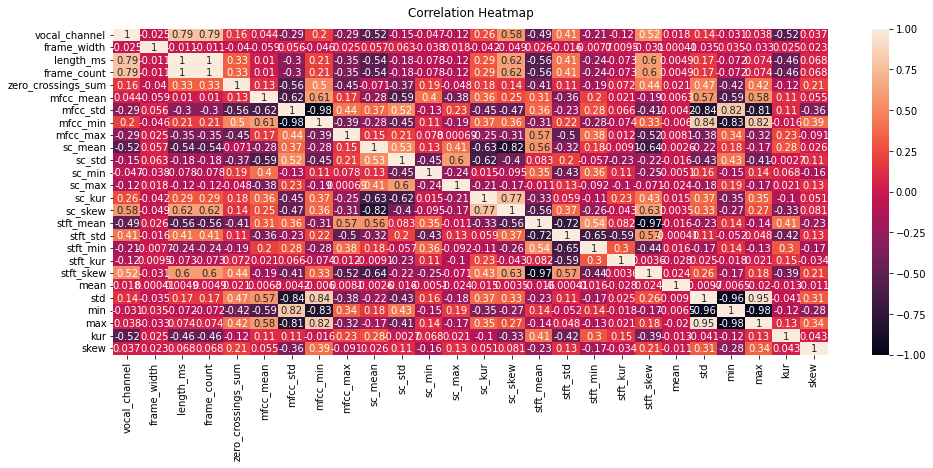

In [ ]:
plt.figure(figsize=(16, 6))
heatmap = sns.heatmap(df1.corr(), vmin=-1, vmax=1, annot=True)
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12);

In [ ]:

ravdess_df = ravdess_df.drop(columns=['frame_count'],axis = 1)

In [ ]:
#ravdess_df.to_csv("ravdess_df_prepared.csv")


###**CLUSTERING**

In [ ]:
# Libraries and utilities

import math
import matplotlib
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
from sklearn.metrics import davies_bouldin_score



from collections import defaultdict
from scipy.stats.stats import pearsonr

In [ ]:
#Clustering utilities

#scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
#evaluation
from sklearn.metrics import silhouette_score,silhouette_samples

import matplotlib.pyplot as plt
import matplotlib.cm as cm

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform
# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram

In [ ]:
df = ravdess_df.copy()
df = df.drop(columns=['emotion','vocal_channel','emotional_intensity','statement','repetition','sex'],axis = 1)

Decido di fare clustering con tutte le variabili continue confrontando diverse scale : molti outlier sono stati lasciati perchè non sono stati reputati come errori. Per questo primo esperimento decido di non toccarli

In [ ]:
X = df.values
scaler = StandardScaler()#Normalizing using the standard scaler
scaler.fit(X)
X_scal = scaler.transform(X)

Creo una funzione per scegliere il miglior k in base all' SSE (utilizzando lo standardScaler)

In [ ]:
!pip install yellowbrick
!pip install kneed
from kneed import KneeLocator
from yellowbrick.cluster import KElbowVisualizer

def res_K_Standard(df, features):
    print("Test effettuato sulle features:")
    print(features)
    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(df[features])
    sse = {}
    silhouette = {}
    bauldin_score = {}
    for k in range(2, 30):
        kmeans = KMeans( init="random", n_clusters=k, max_iter=1000).fit(scaled_features)
        #L'inertia è la somma delle distanza degli esempio rispetto al centro del cluster più vicino
        sse[k] = kmeans.inertia_
        silhouette[k] = silhouette_score(scaled_features, kmeans.labels_)
        bauldin_score[k] = davies_bouldin_score(scaled_features, kmeans.labels_)

    plt.figure()
    plt.style.use('seaborn-darkgrid')
    plt.plot(list(sse.keys()), list(sse.values()))
    plt.xlabel("k")
    plt.ylabel("SSE")
    plt.show()
    kl = KneeLocator(
        range(2, 30), list(sse.values()), curve="convex", direction="decreasing"
    )

    print(kl.elbow)

    #model = KMeans()
    #visualizer = KElbowVisualizer(
            #model, k=(2,30), metric='silhouette',locate_elbow=True
    #)

    #visualizer.fit(scaled_features)        # Fit the data to the visualizer
    #visualizer.show()


    print("***************************************")

    return sse, silhouette, kl.elbow , bauldin_score


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Test effettuato sulle features:
Index(['frame_width', 'length_ms', 'zero_crossings_sum', 'mfcc_mean',
       'mfcc_std', 'mfcc_min', 'mfcc_max', 'sc_mean', 'sc_std', 'sc_min',
       'sc_max', 'sc_kur', 'sc_skew', 'stft_mean', 'stft_std', 'stft_min',
       'stft_kur', 'stft_skew', 'mean', 'std', 'min', 'max', 'kur', 'skew'],
      dtype='object')


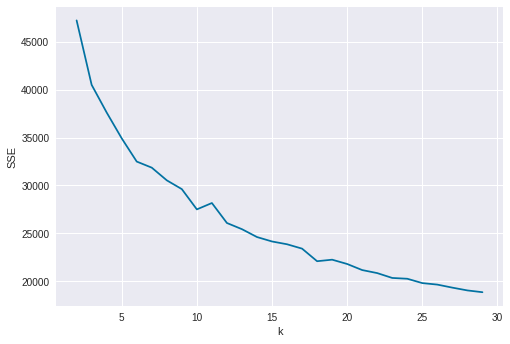

10
***************************************
k = 2| SSE = 47219.60366574771| silhouette = 0.18440292915959539|bauldin = 1.8484252235762888
k = 3| SSE = 40494.71847481616| silhouette = 0.18581801273871099|bauldin = 1.69454361366617
k = 4| SSE = 37609.95789236222| silhouette = 0.13083805942537333|bauldin = 1.9173082653319327
k = 5| SSE = 34916.40323253445| silhouette = 0.14892062608445236|bauldin = 1.7384145927821535
k = 6| SSE = 32492.024697854686| silhouette = 0.15202578412529089|bauldin = 1.4931634931003697
k = 7| SSE = 31857.534436056536| silhouette = 0.1423010546586912|bauldin = 1.7102262131842516
k = 8| SSE = 30535.15313398939| silhouette = 0.13868820758482772|bauldin = 1.7625034995105286
k = 9| SSE = 29618.01979098352| silhouette = 0.13825502728948236|bauldin = 1.786827001066251
k = 10| SSE = 27503.927207487417| silhouette = 0.14255592029038644|bauldin = 1.5243015802828137
k = 11| SSE = 28167.89873186921| silhouette = 0.1266276921552917|bauldin = 1.7307031608261605
k = 12| SSE = 260

In [ ]:
sse, silhouette, kl,bauldin = res_K_Standard(df, df.columns)
for i in range(2, 30):
    print("k = " + str(i) + "| SSE = " + str(sse[i]) + "| silhouette = " + str(silhouette[i])+"|bauldin = " + str(bauldin[i]))
print(kl)

Mi serve una funzione per confrontare le  diverse  Silhouette restituite ☺️

In [ ]:
from yellowbrick.cluster import SilhouetteVisualizer
def Silhouette_plot(X_scal):
  #colors=['C0', 'C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9']
  #fig, axs = plt.subplots(30-2, 2, figsize=(10,10))
  for i in range(2, 30):
      kmeans = KMeans( init="random", n_clusters=i, max_iter=1000)
      visualizer = SilhouetteVisualizer(kmeans)
      print('k = '+str(i))
      #axs[i-2][0].set_ylabel("k=" + str(i))
      visualizer.fit(X_scal)
      visualizer.show()
      #plt.tight_layout()

k = 2


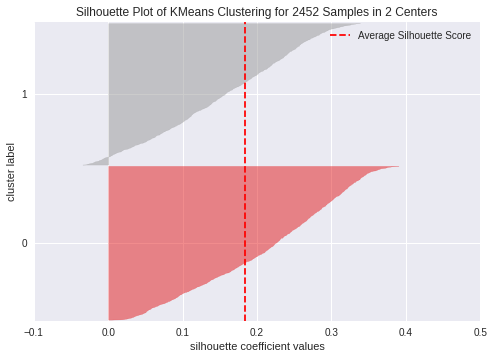

k = 3


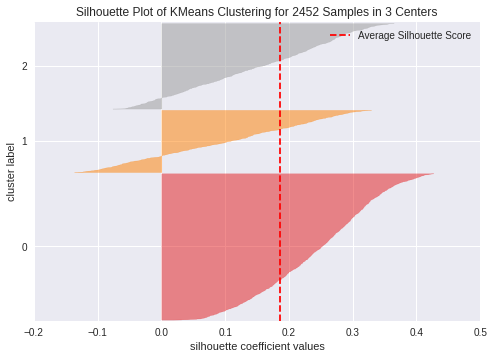

k = 4


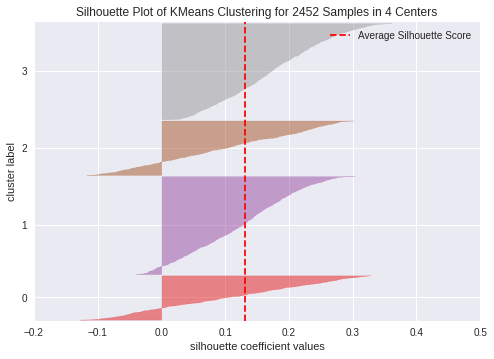

k = 5


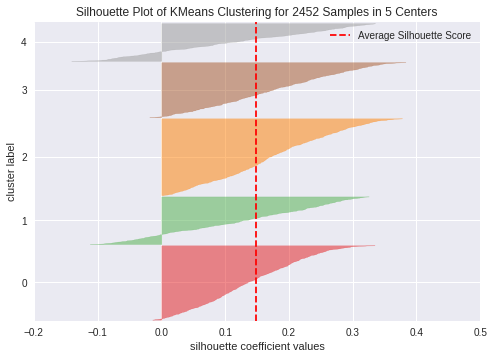

k = 6


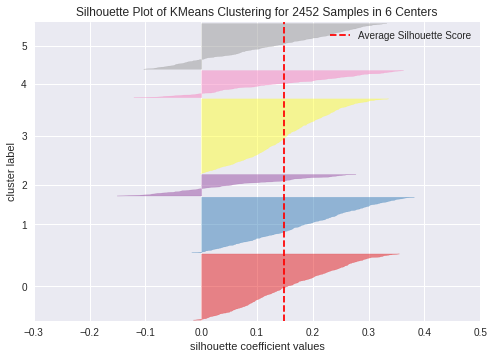

k = 7


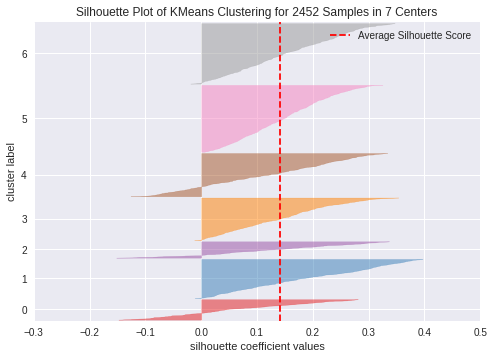

k = 8


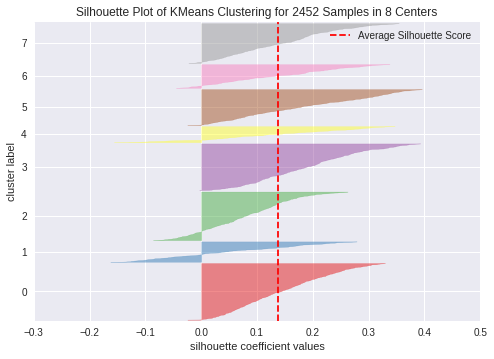

k = 9


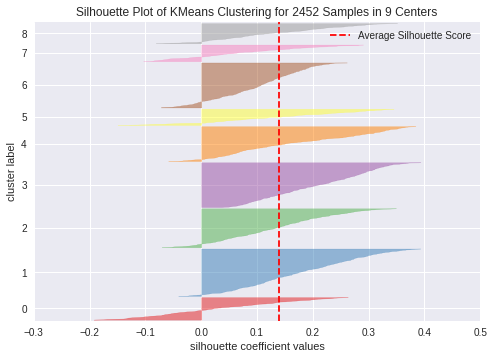

k = 10


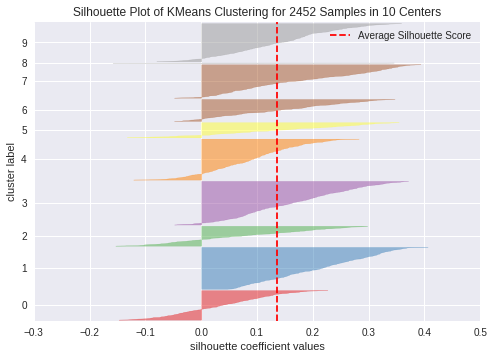

k = 11


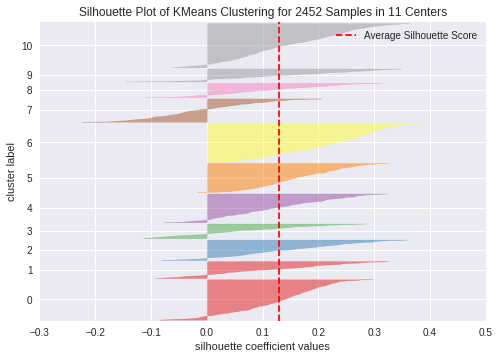

k = 12


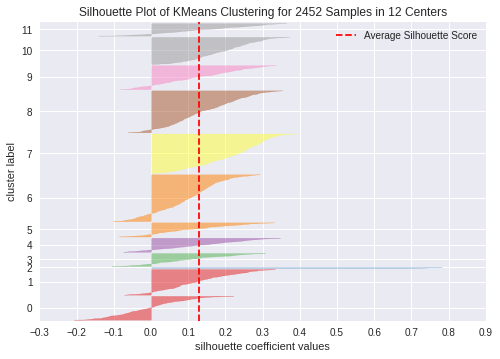

k = 13


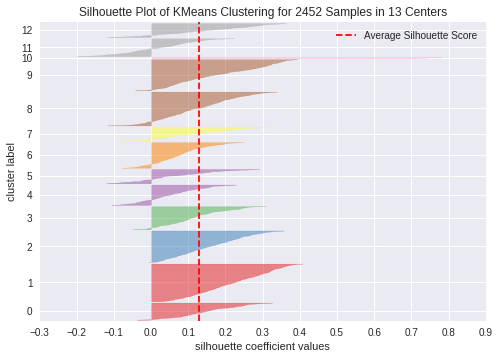

k = 14


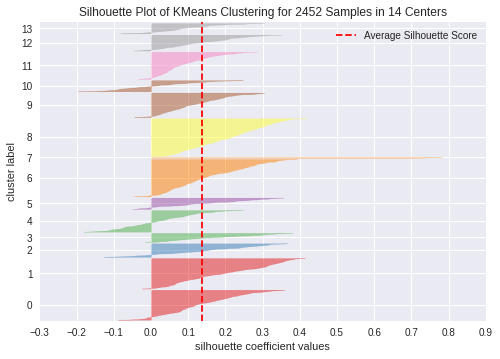

k = 15


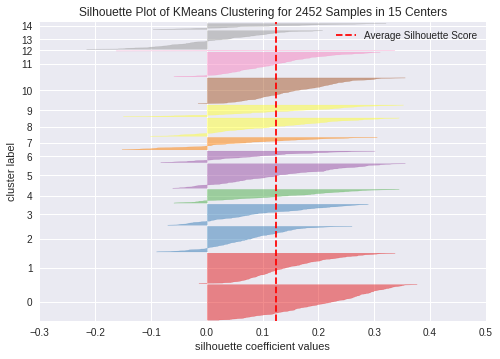

k = 16


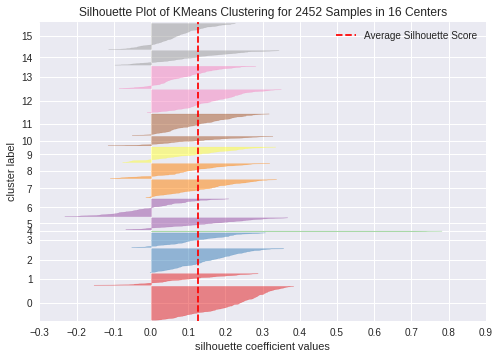

k = 17


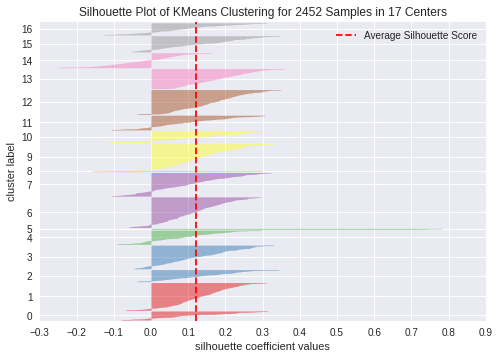

k = 18


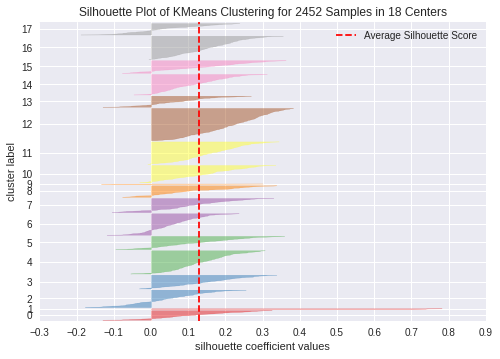

k = 19


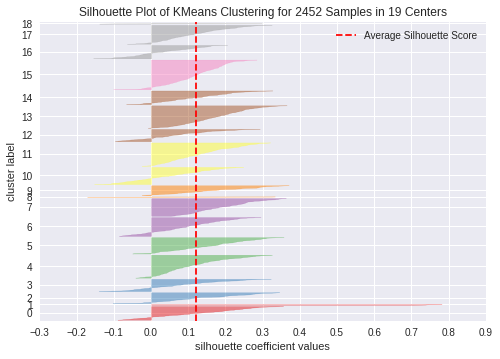

k = 20


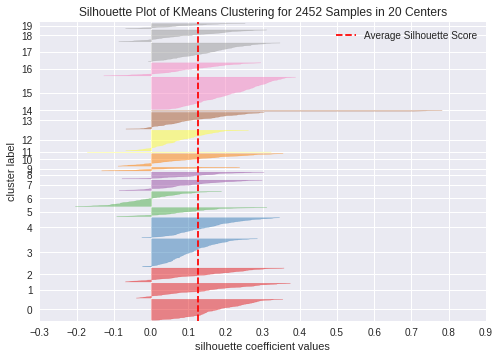

k = 21


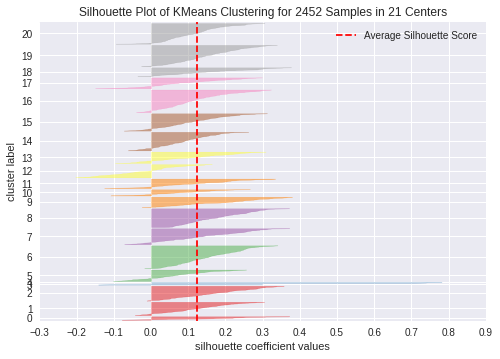

k = 22


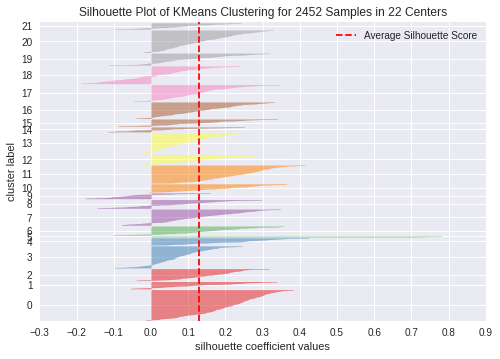

k = 23


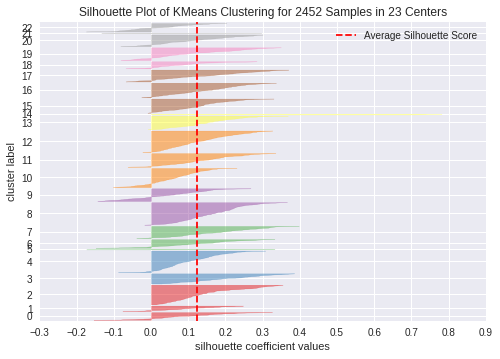

k = 24


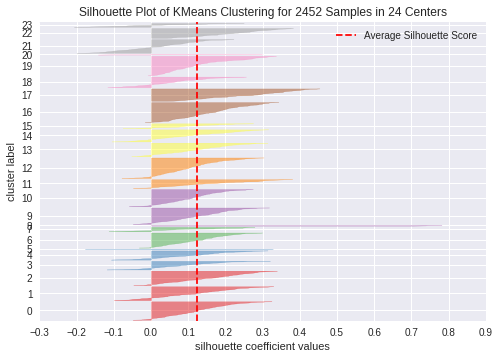

k = 25


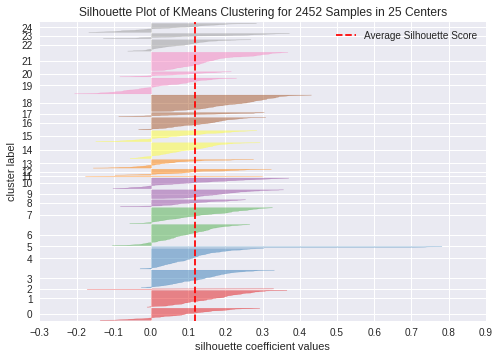

k = 26


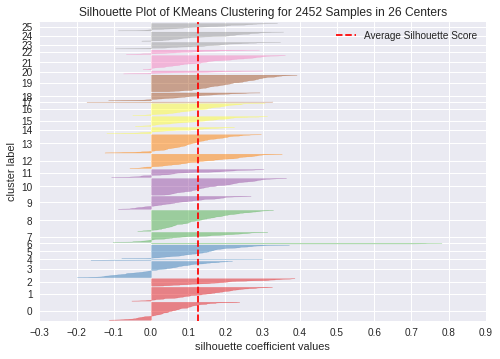

k = 27


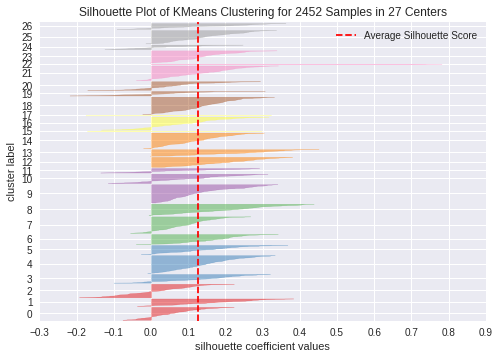

k = 28


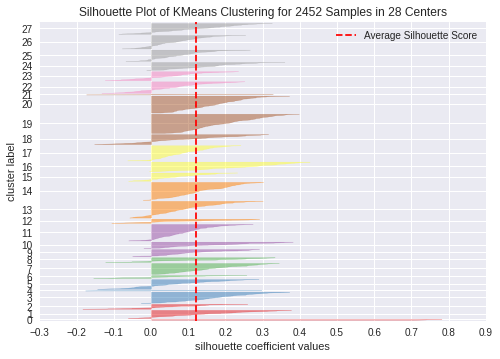

k = 29


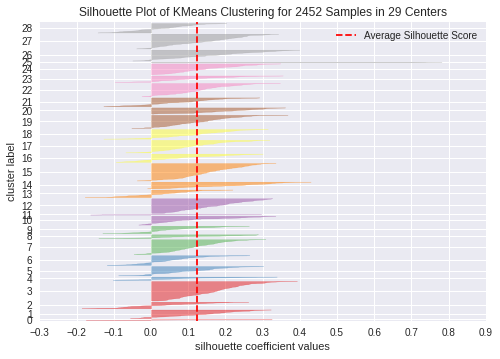

In [ ]:
Silhouette_plot(X_scal)

Parallel plot di tutte le feature

In [ ]:
def parallel_plot(k,scale,features):
  kmeans = KMeans(n_clusters=k, max_iter=1000).fit(scale)
  plt.figure(figsize=(30, 12))
  centers = kmeans.cluster_centers_
  #centers = scaler.inverse_transform(centers)
  for i in range(0, len(centers)):
      plt.plot(centers[i], marker='o', label='Cluster %s' % i)
  plt.tick_params(axis='both', which='major', labelsize=22)
  plt.xticks(range(0, len(features)), features, fontsize=14)
  plt.legend(fontsize=18)
  plt.show()

In [ ]:
X = df.values
scaler = StandardScaler()#Normalizing using the standard scaler
scaler.fit(X)
X_scal = scaler.transform(X)

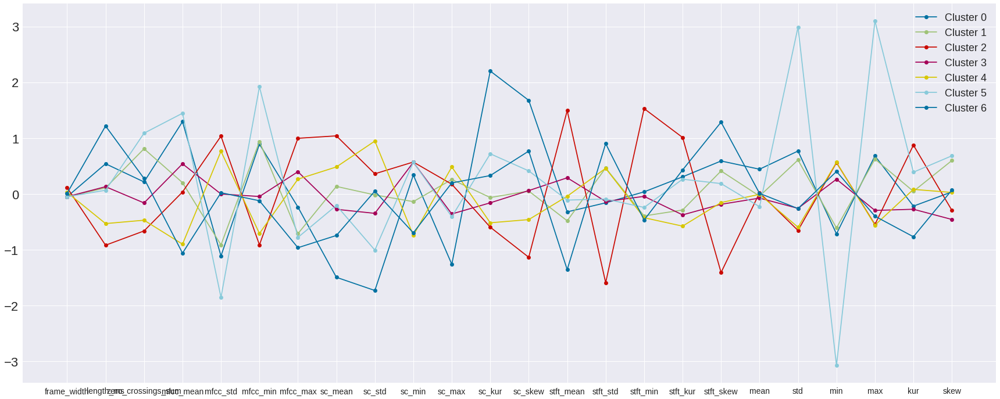

In [ ]:
parallel_plot(7,X_scal,df.columns)

Secondo esperimento : con la RobustScaler ottengo dei risultati pessimi 😭
provo con MinMax

In [ ]:
X = df.values
scaler = MinMaxScaler()#Normalizing using the standard scaler
scaler.fit(X)
X_scal = scaler.transform(X)

Creo una funzione per scegliere il miglior k in base all' SSE (utilizzando lo standardScaler)

In [ ]:
!pip install yellowbrick
!pip install kneed
from kneed import KneeLocator
from yellowbrick.cluster import KElbowVisualizer

def res_K_minMax(df, features):
    print("Test effettuato sulle features:")
    print(features)
    scaler = MinMaxScaler()
    scaled_features = scaler.fit_transform(df[features])
    sse = {}
    silhouette = {}
    bauldin_score = {}
    for k in range(2, 30):
        kmeans = KMeans( init="random", n_clusters=k, max_iter=1000).fit(scaled_features)
        #L'inertia è la somma delle distanza degli esempio rispetto al centro del cluster più vicino
        sse[k] = kmeans.inertia_
        silhouette[k] = silhouette_score(scaled_features, kmeans.labels_)
        bauldin_score[k] = davies_bouldin_score(scaled_features, kmeans.labels_)

    plt.figure()
    plt.style.use('seaborn-darkgrid')
    plt.plot(list(sse.keys()), list(sse.values()))
    plt.xlabel("k")
    plt.ylabel("SSE")
    plt.show()
    kl = KneeLocator(
        range(2, 30), list(sse.values()), curve="convex", direction="decreasing"
    )

    print(kl.elbow)

    #model = KMeans()
    #visualizer = KElbowVisualizer(
            #model, k=(2,30), metric='silhouette',locate_elbow=True
    #)

    #visualizer.fit(scaled_features)        # Fit the data to the visualizer
    #visualizer.show()


    print("***************************************")

    return sse, silhouette, kl.elbow , bauldin_score


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


Test effettuato sulle features:
Index(['frame_width', 'length_ms', 'zero_crossings_sum', 'mfcc_mean',
       'mfcc_std', 'mfcc_min', 'mfcc_max', 'sc_mean', 'sc_std', 'sc_min',
       'sc_max', 'sc_kur', 'sc_skew', 'stft_mean', 'stft_std', 'stft_min',
       'stft_kur', 'stft_skew', 'mean', 'std', 'min', 'max', 'kur', 'skew'],
      dtype='object')


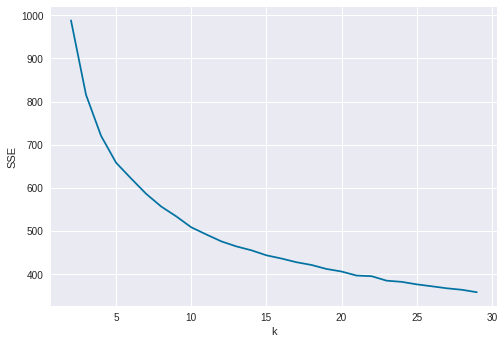

10
***************************************
k = 2| SSE = 987.9490318588273| silhouette = 0.20049838048324606|bauldin = 1.7429096921906866
k = 3| SSE = 815.5918227686693| silhouette = 0.19620567763925323|bauldin = 1.6091073724456464
k = 4| SSE = 720.4230022322832| silhouette = 0.18862848688131892|bauldin = 1.6025941405149933
k = 5| SSE = 658.1730295779905| silhouette = 0.1852556884211188|bauldin = 1.5506328943490408
k = 6| SSE = 621.5993385187544| silhouette = 0.1777343620532539|bauldin = 1.6181998102598314
k = 7| SSE = 586.0700743023107| silhouette = 0.17878864388498708|bauldin = 1.5527572608402374
k = 8| SSE = 556.675655566611| silhouette = 0.1708517184360062|bauldin = 1.6214178010226958
k = 9| SSE = 533.8844762044077| silhouette = 0.16379068121798632|bauldin = 1.6748044041707209
k = 10| SSE = 508.56567760013866| silhouette = 0.17004121371218825|bauldin = 1.6193519925340278
k = 11| SSE = 491.95749178328174| silhouette = 0.16403193302436425|bauldin = 1.5790252644886513
k = 12| SSE = 475

In [ ]:
sse, silhouette, kl,bauldin = res_K_minMax(df, df.columns)
for i in range(2, 30):
    print("k = " + str(i) + "| SSE = " + str(sse[i]) + "| silhouette = " + str(silhouette[i])+"|bauldin = " + str(bauldin[i]))
print(kl)

k = 2


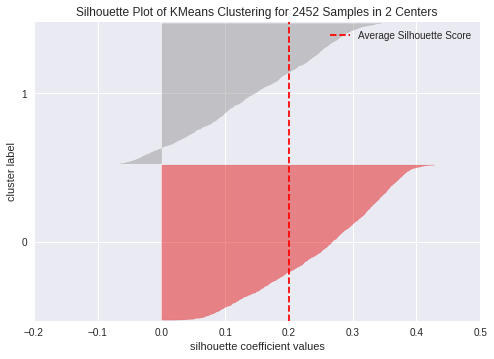

k = 3


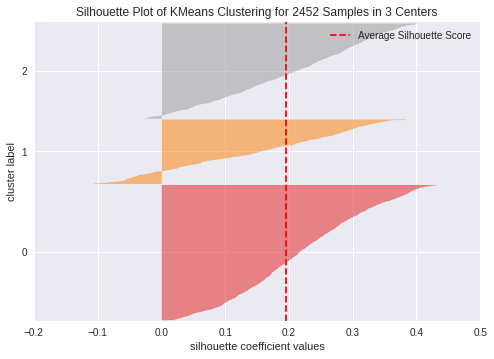

k = 4


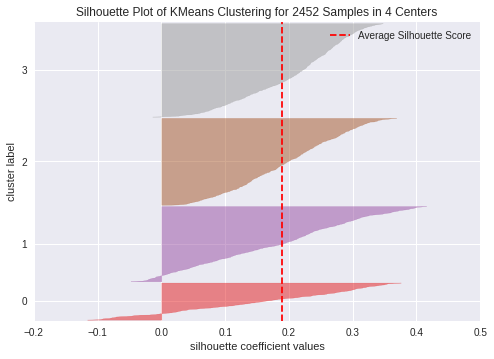

k = 5


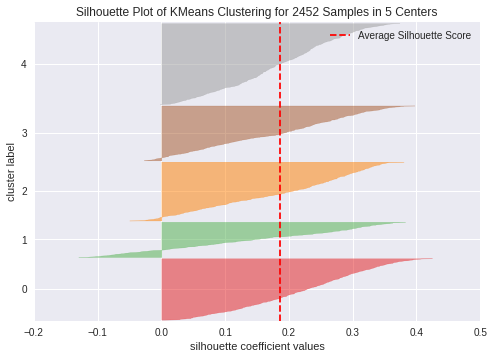

k = 6


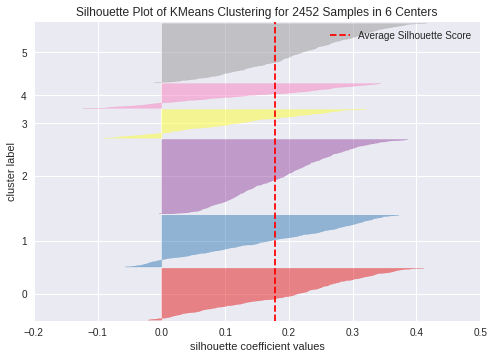

k = 7


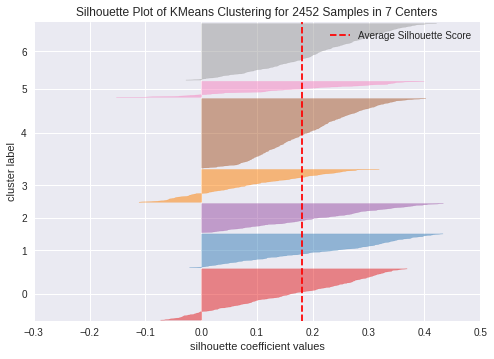

k = 8


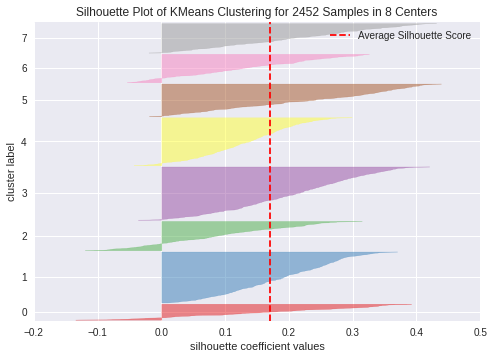

k = 9


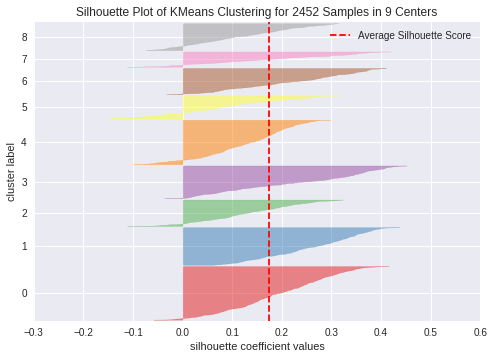

k = 10


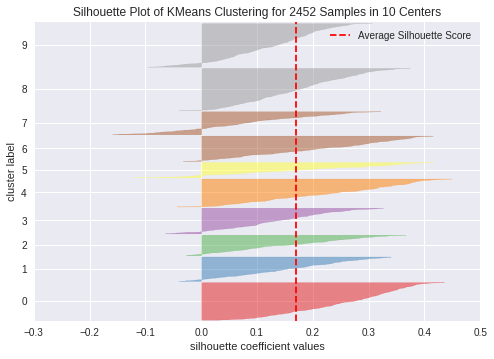

k = 11


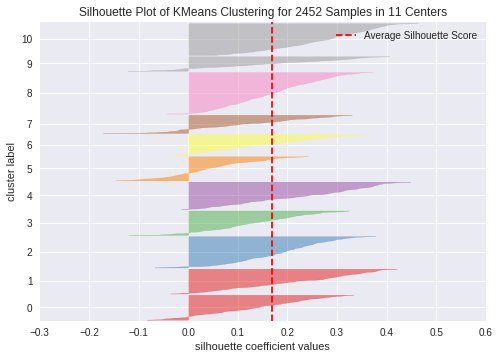

k = 12


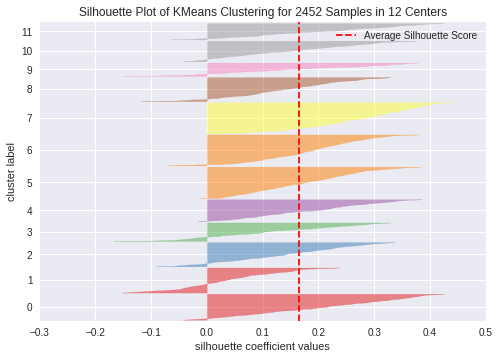

k = 13


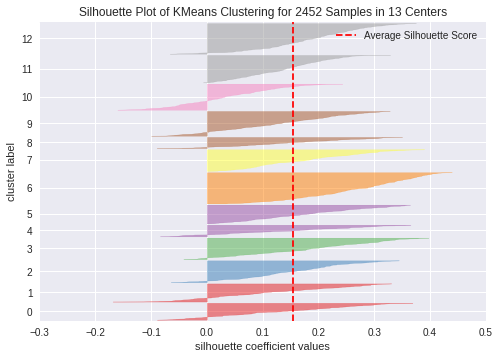

k = 14


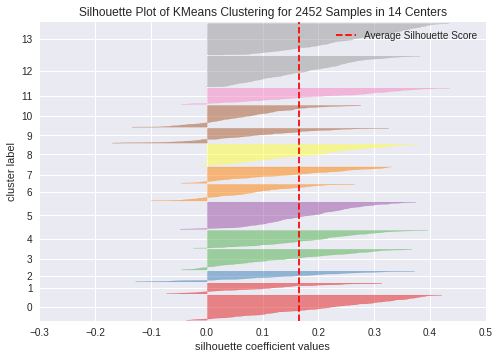

k = 15


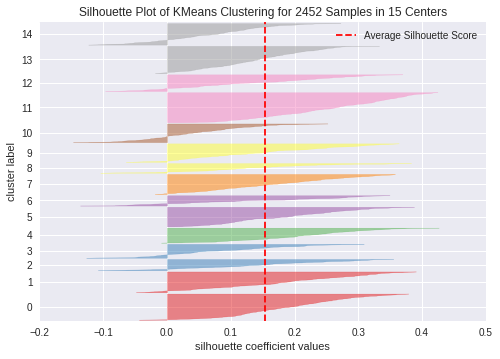

k = 16


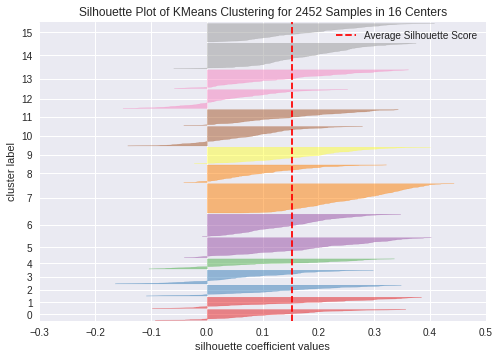

k = 17


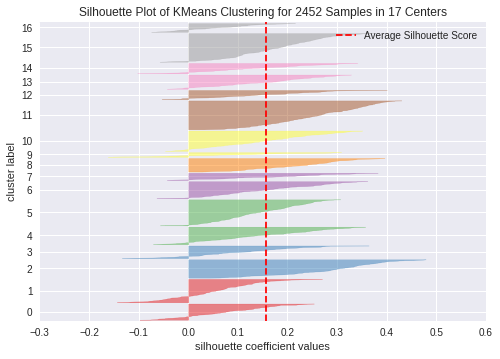

k = 18


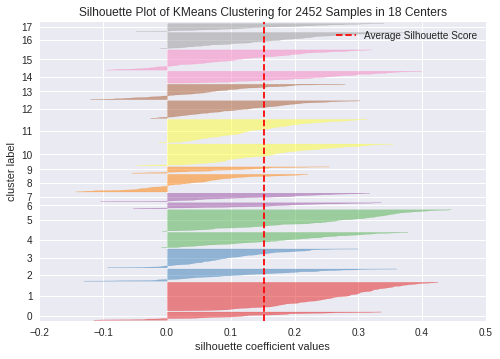

k = 19


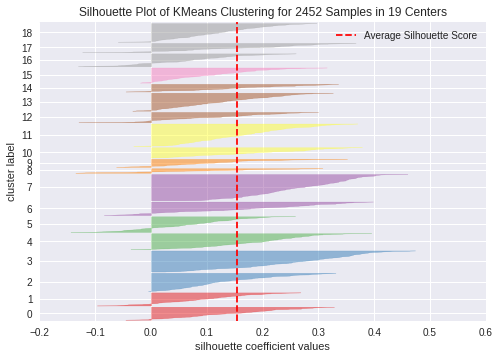

k = 20


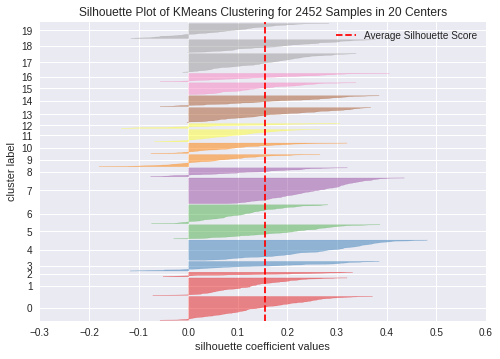

k = 21


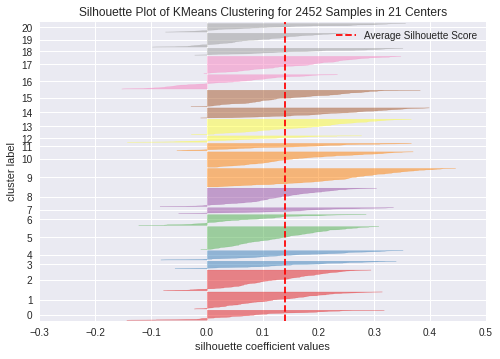

k = 22


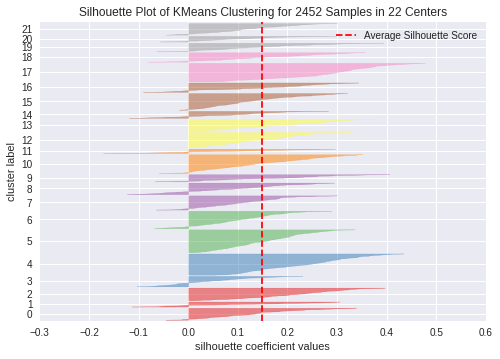

k = 23


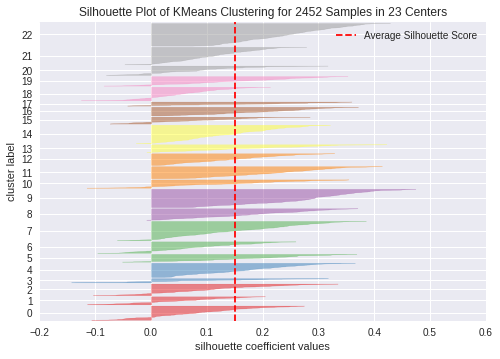

k = 24


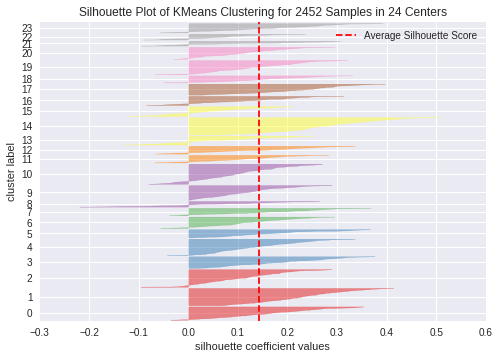

k = 25


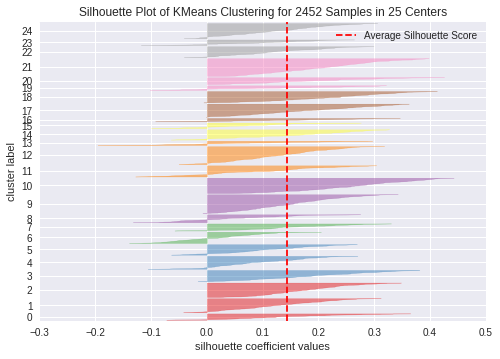

k = 26


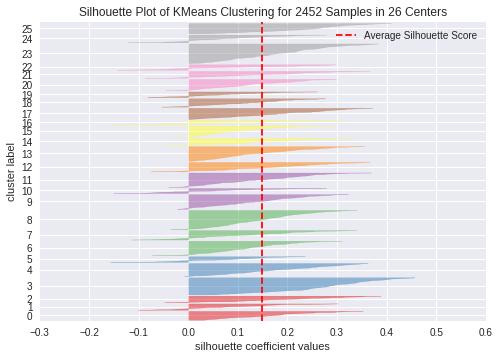

k = 27


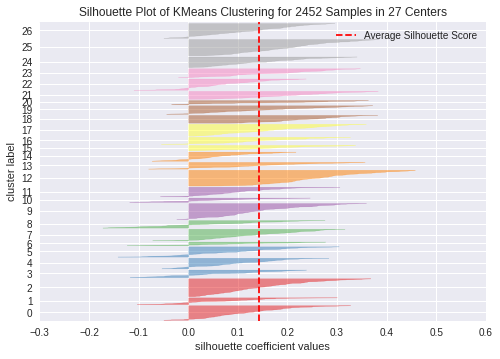

k = 28


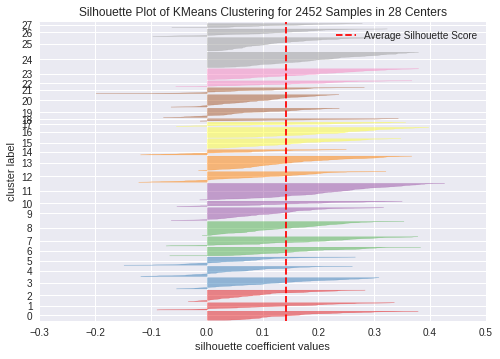

k = 29


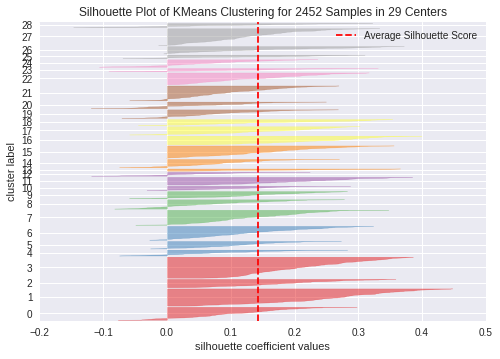

In [ ]:
Silhouette_plot(X_scal)

In [ ]:
X = df.values
scaler = MinMaxScaler()#Normalizing using the standard scaler
scaler.fit(X)
X_scal = scaler.transform(X)

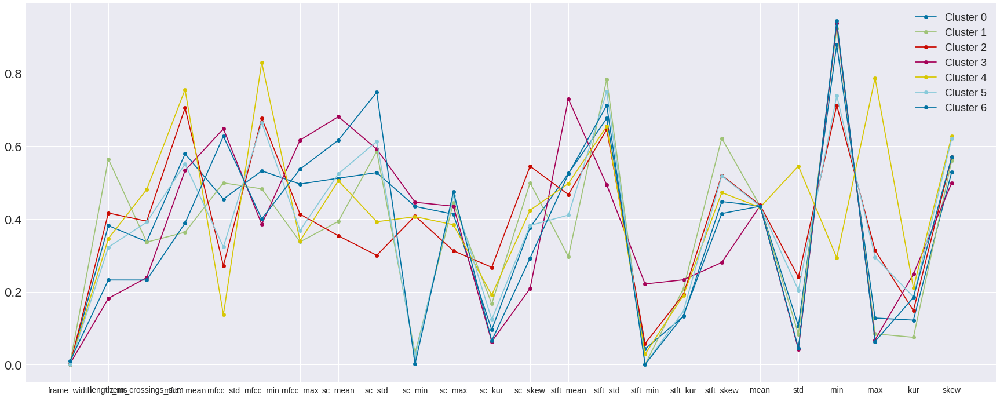

In [ ]:
parallel_plot(7,X_scal,df.columns)

Gli esperimenti 1 e 2 non sono andati a buon fine : ci sono troppe features
Seleziono un sottoinsieme di variabili. Vedo come va con i primi esperimenti...
se va male decido di eliminare gli outlier

In [ ]:
df.columns


Index(['frame_width', 'length_ms', 'zero_crossings_sum', 'mfcc_mean',
       'mfcc_std', 'mfcc_min', 'mfcc_max', 'sc_mean', 'sc_std', 'sc_min',
       'sc_max', 'sc_kur', 'sc_skew', 'stft_mean', 'stft_std', 'stft_min',
       'stft_kur', 'stft_skew', 'mean', 'std', 'min', 'max', 'kur', 'skew'],
      dtype='object')

In [ ]:
statistiche_audio = ['length_ms', 'zero_crossings_sum','mfcc_min', 'mfcc_max','mfcc_mean']

In [ ]:
scaler = StandardScaler()#Normalizing using the standard scaler
scaler.fit(df[statistiche_audio])
X_scal = scaler.transform(df[statistiche_audio])

k = 2


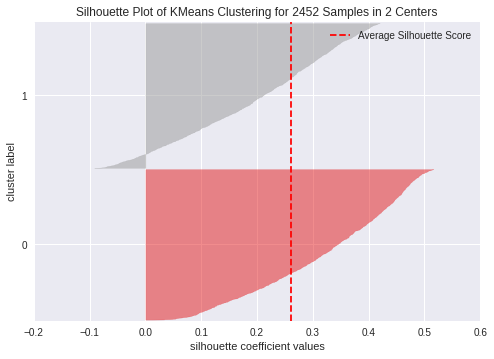

k = 3


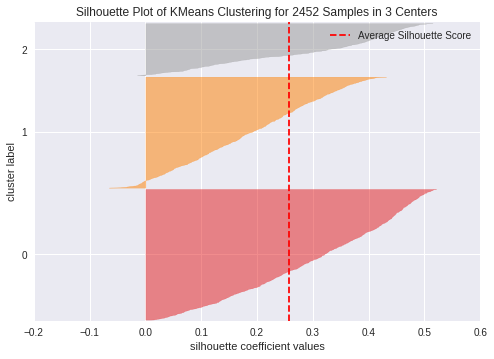

k = 4


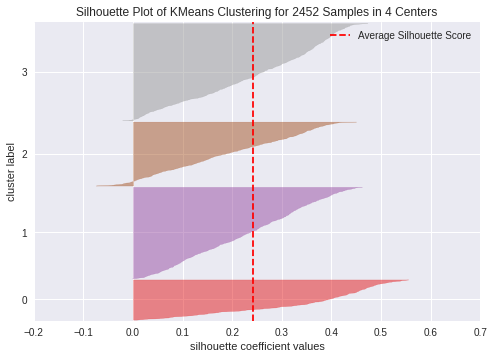

k = 5


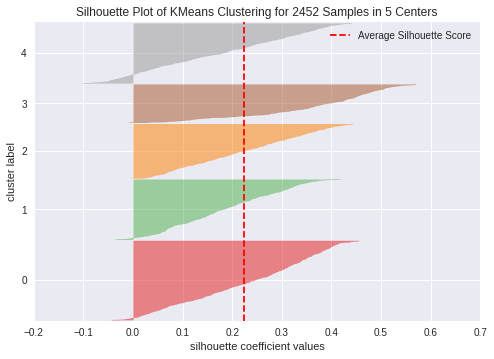

k = 6


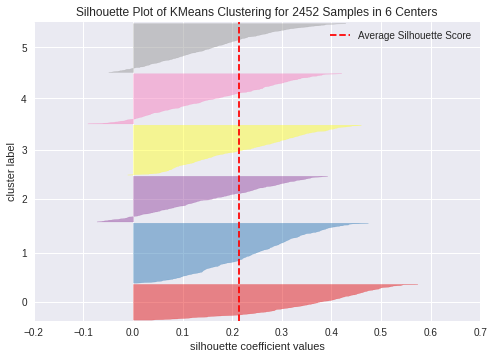

k = 7


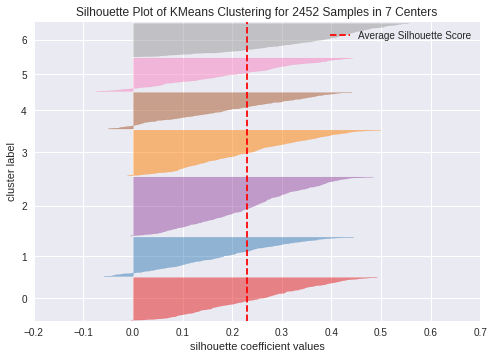

k = 8


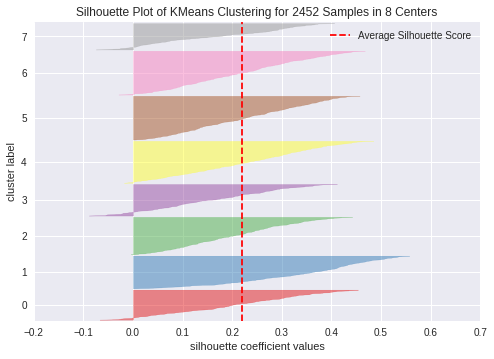

k = 9


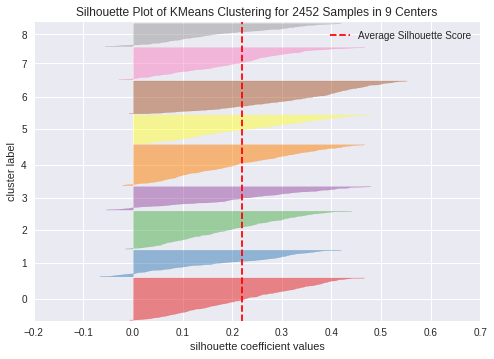

k = 10


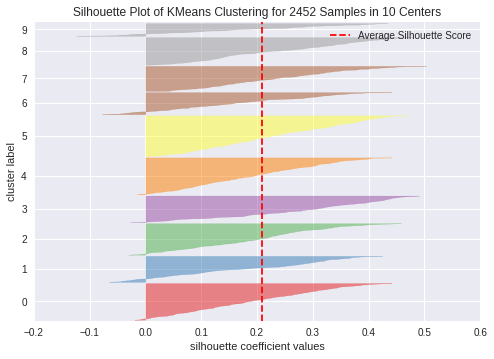

k = 11


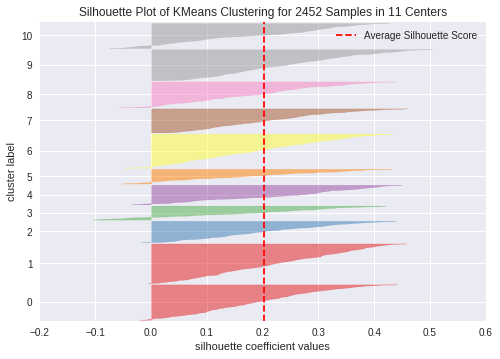

k = 12


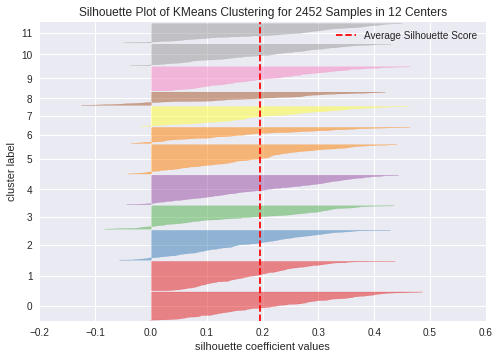

k = 13


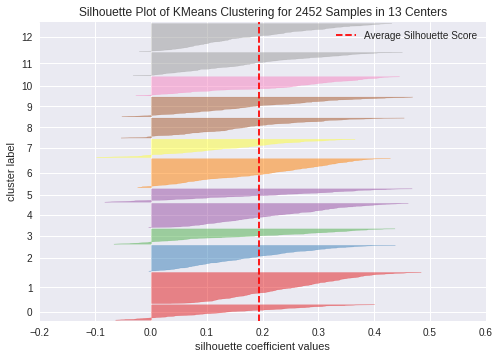

k = 14


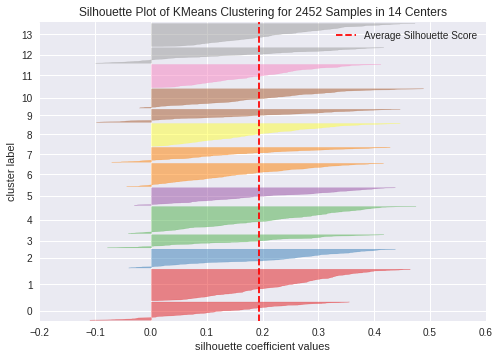

k = 15


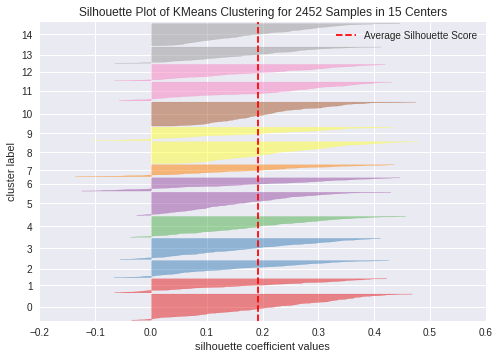

k = 16


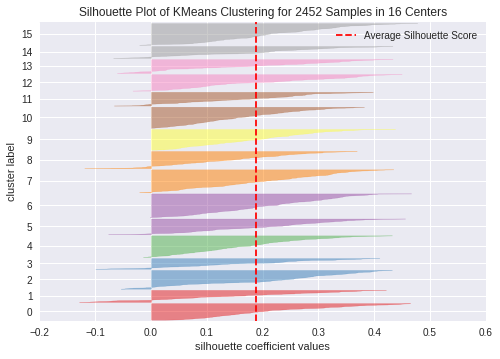

k = 17


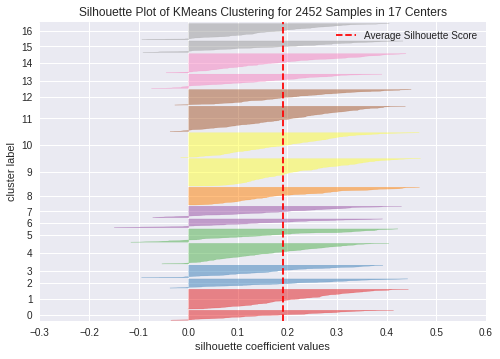

k = 18


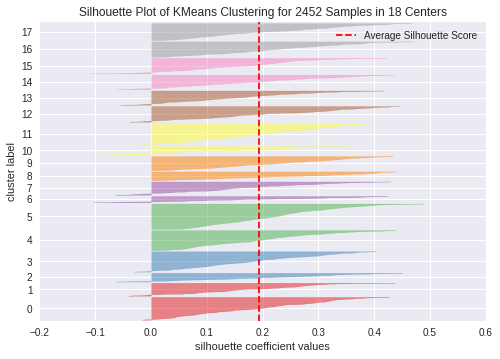

k = 19


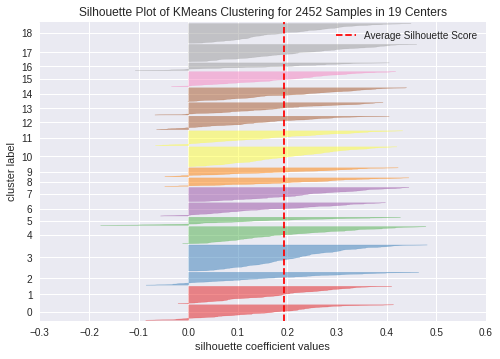

k = 20


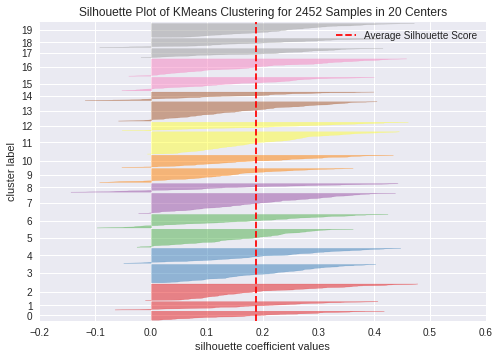

k = 21


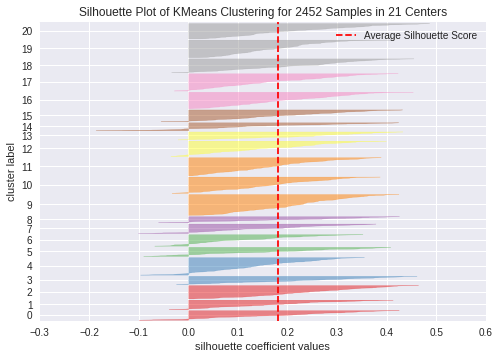

k = 22


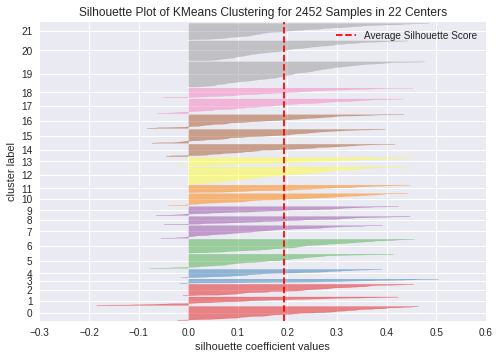

k = 23


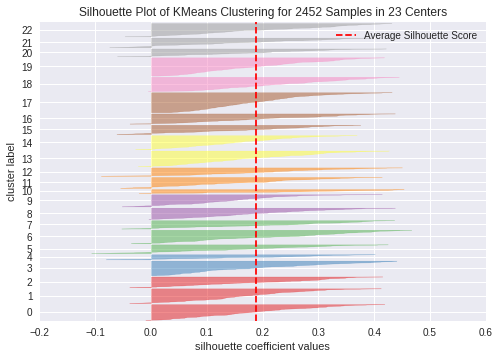

k = 24


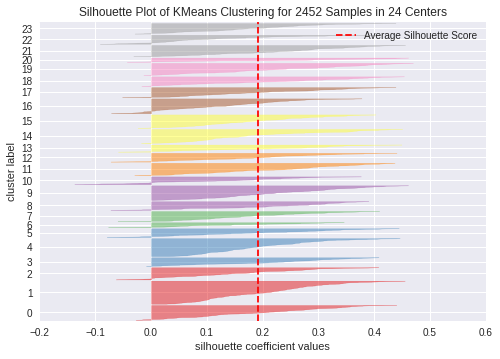

k = 25


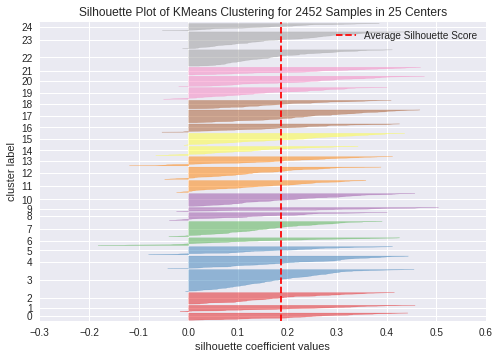

k = 26


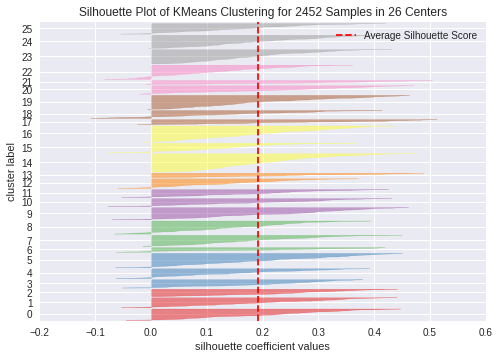

k = 27


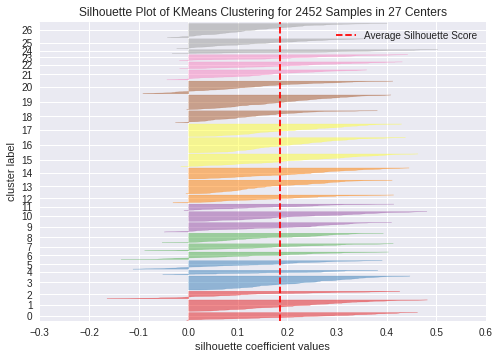

k = 28


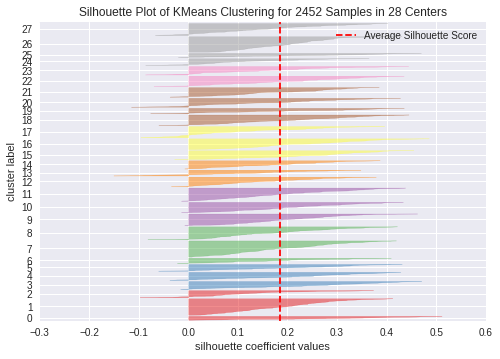

k = 29


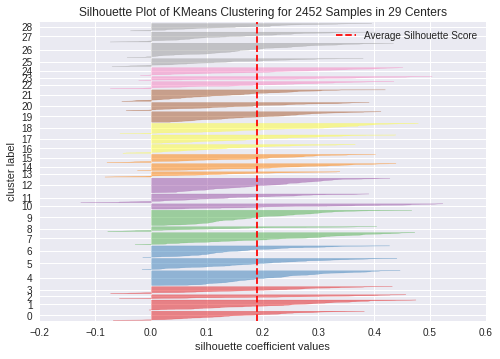

In [ ]:
Silhouette_plot(X_scal)

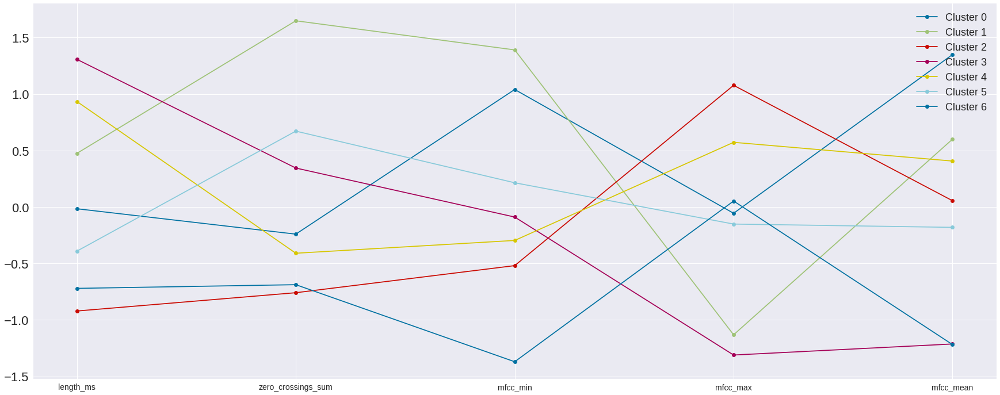

In [ ]:
parallel_plot(7,X_scal,statistiche_audio)#k = 5 + STandard

Ripeto l' esperimento  utilizzando il MinMaxScaler

In [ ]:
scaler = MinMaxScaler()#Normalizing using the standard scaler
scaler.fit(df[statistiche_audio])
X_scal = scaler.transform(df[statistiche_audio])

Test effettuato sulle features:
['length_ms', 'zero_crossings_sum', 'mfcc_min', 'mfcc_max', 'mfcc_mean']


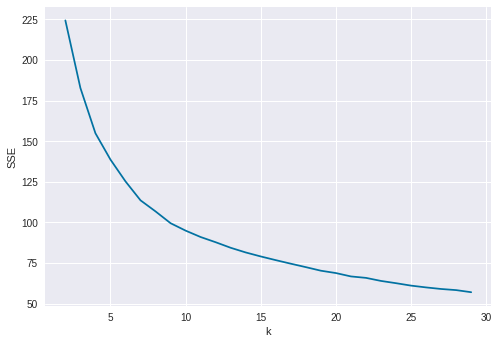

9
***************************************
k = 2| SSE = 224.38955902365487| silhouette = 0.26258825105998884|bauldin = 1.4410999346078825
k = 3| SSE = 182.78320381915847| silhouette = 0.2590053385693308|bauldin = 1.338612530760208
k = 4| SSE = 154.90736384330847| silhouette = 0.24194948529261673|bauldin = 1.3211214611949318
k = 5| SSE = 138.69129974348675| silhouette = 0.22568505483944543|bauldin = 1.3391002249864814
k = 6| SSE = 125.26314451398758| silhouette = 0.22218100862420526|bauldin = 1.3676615696564554
k = 7| SSE = 113.59941161807177| silhouette = 0.2316832513282418|bauldin = 1.2487166463219364
k = 8| SSE = 106.77326195056813| silhouette = 0.21922387166557067|bauldin = 1.2849374361713883
k = 9| SSE = 99.51212391227082| silhouette = 0.2211673966569021|bauldin = 1.2678911358617004
k = 10| SSE = 94.94434695980928| silhouette = 0.20687716265697148|bauldin = 1.2855988649191021
k = 11| SSE = 91.00441282796889| silhouette = 0.20347766775828854|bauldin = 1.2851768705203084
k = 12| SSE =

In [ ]:
sse, silhouette, kl,bauldin = res_K_minMax(df, statistiche_audio)
for i in range(2, 30):
    print("k = " + str(i) + "| SSE = " + str(sse[i]) + "| silhouette = " + str(silhouette[i])+"|bauldin = " + str(bauldin[i]))
print(kl)

k = 2


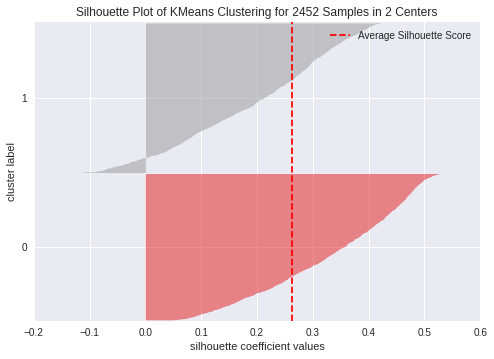

k = 3


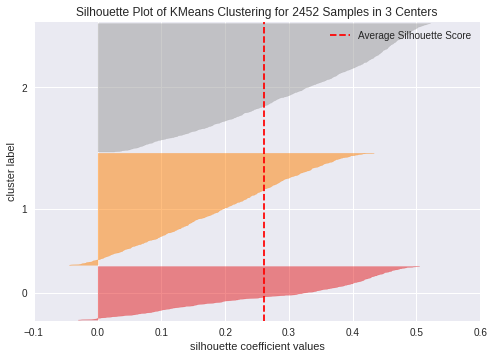

k = 4


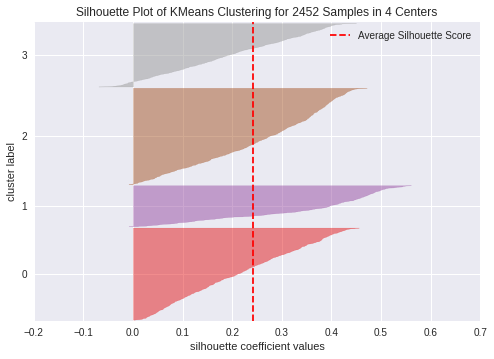

k = 5


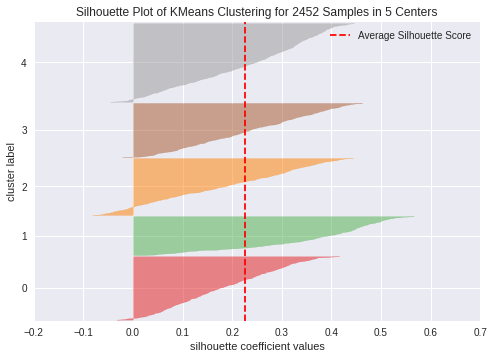

k = 6


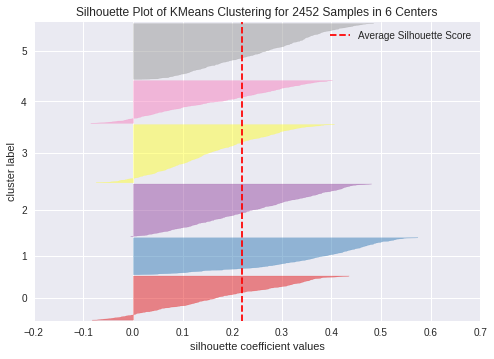

k = 7


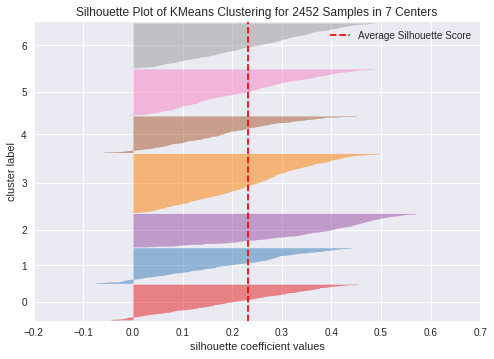

k = 8


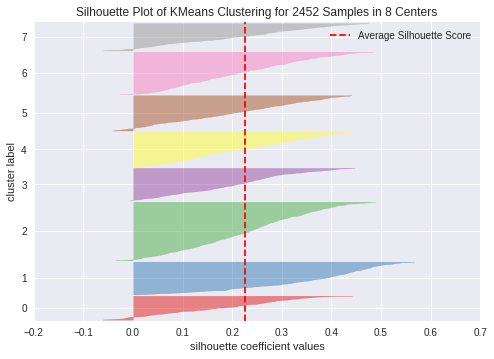

k = 9


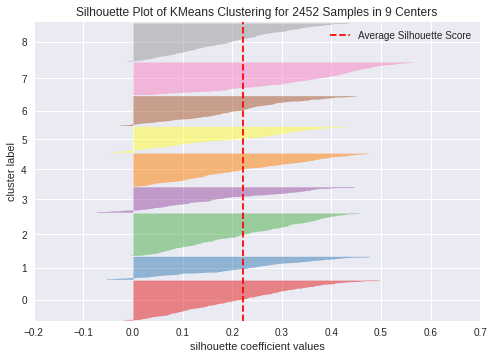

k = 10


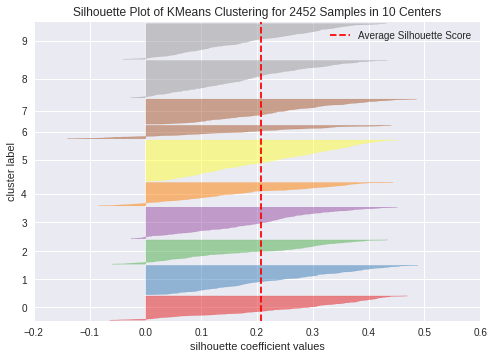

k = 11


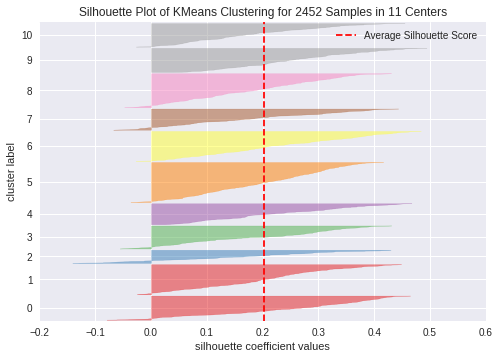

k = 12


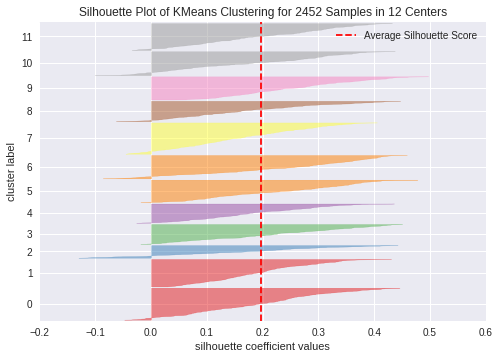

k = 13


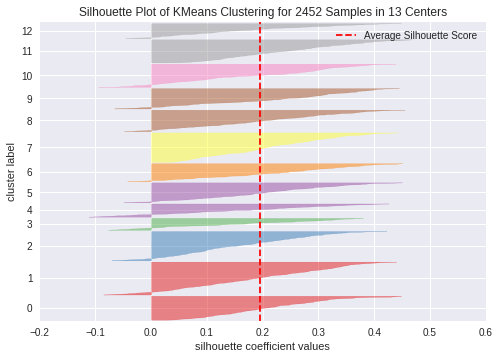

k = 14


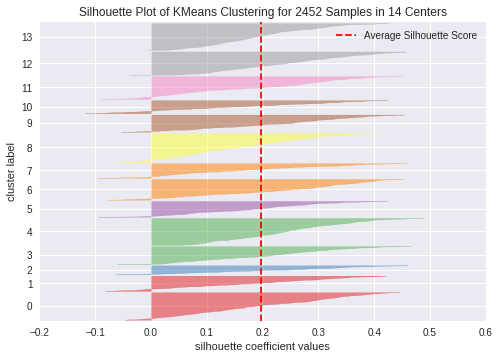

k = 15


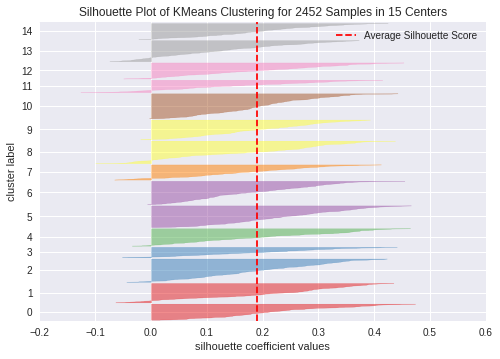

k = 16


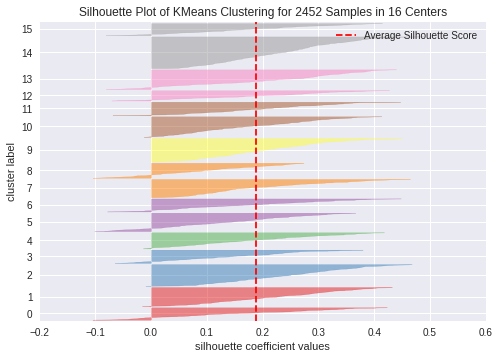

k = 17


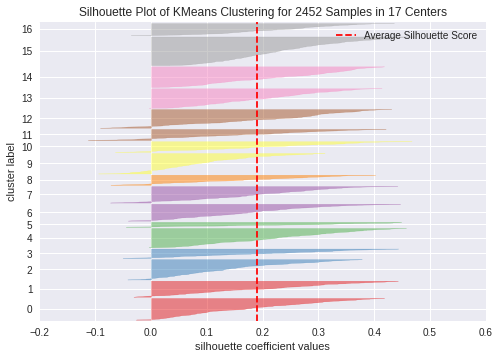

k = 18


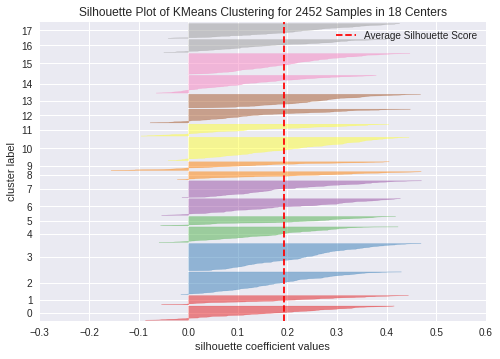

k = 19


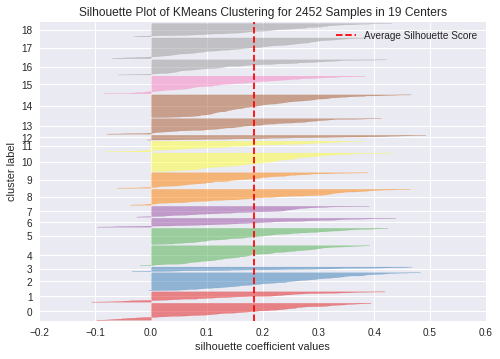

k = 20


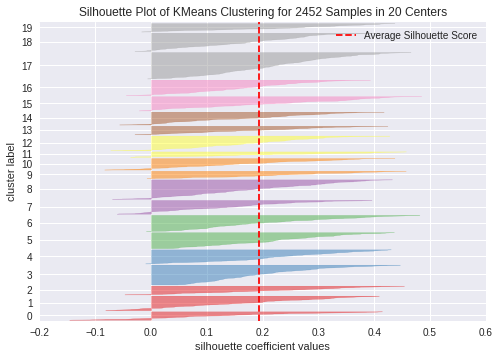

k = 21


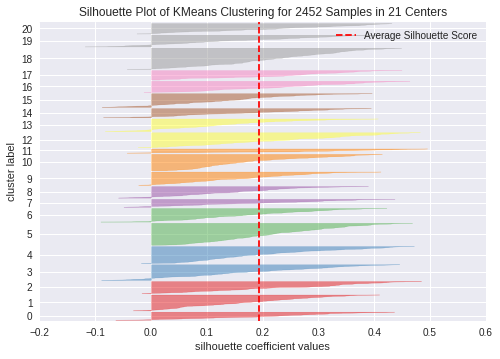

k = 22


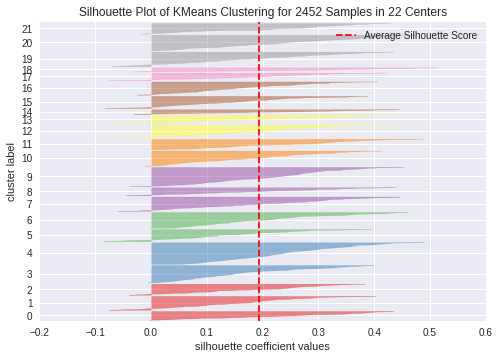

k = 23


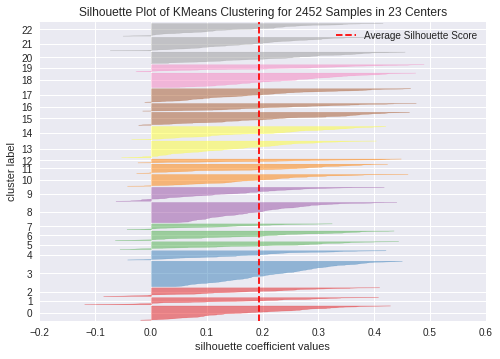

k = 24


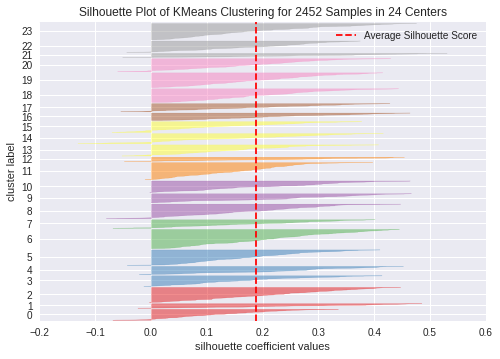

k = 25


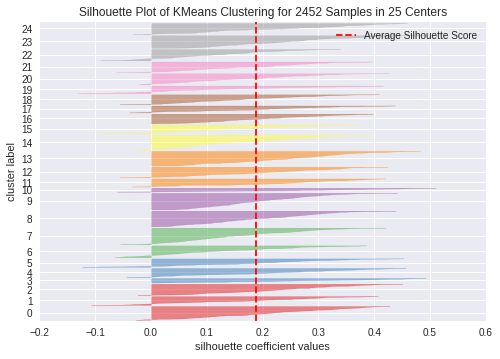

k = 26


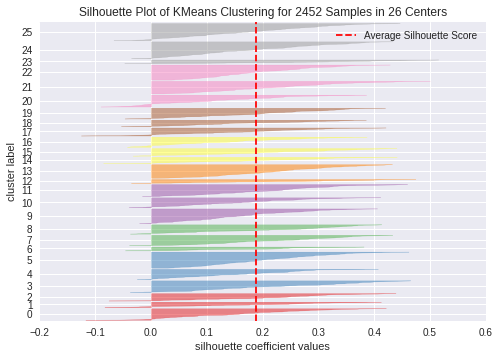

k = 27


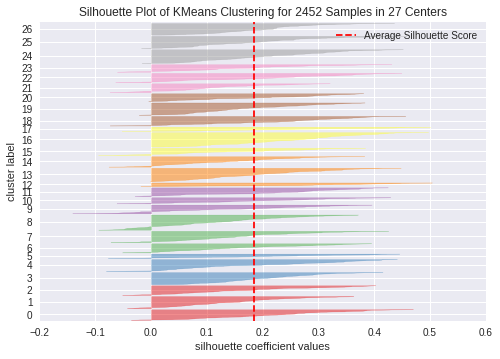

k = 28


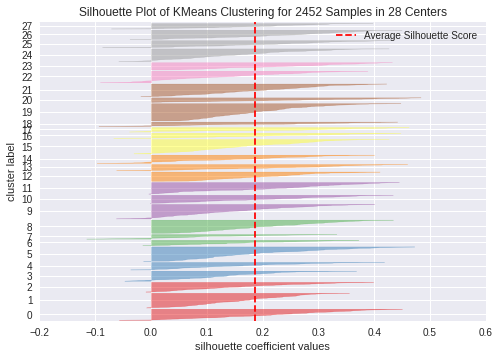

k = 29


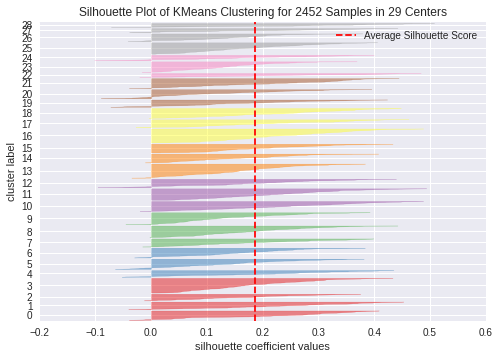

In [ ]:
Silhouette_plot(X_scal)

In [ ]:
scaler = MinMaxScaler()#Normalizing using the standard scaler
scaler.fit(df[statistiche_audio])
X_scal = scaler.transform(df[statistiche_audio])

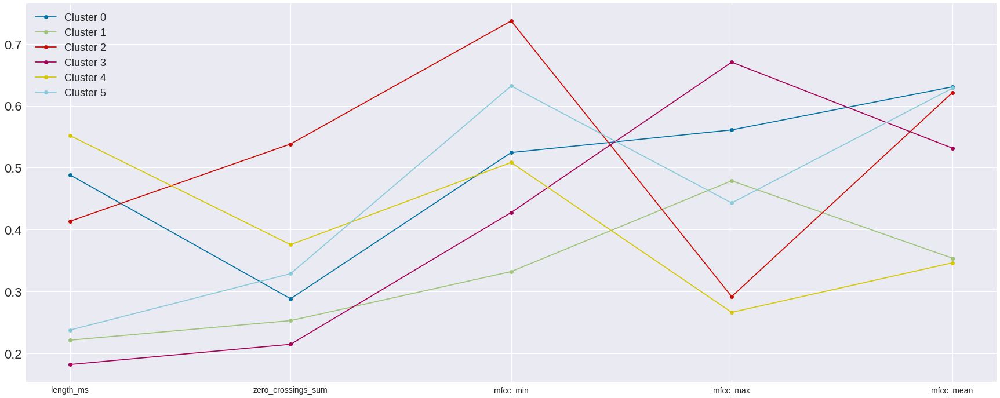

In [ ]:
parallel_plot(6,X_scal,statistiche_audio)

Idea : vedo gli outlier e vedo di eliminarli

### Torno agli esperimenti originali

Scatter plot

In [ ]:
scaler = MinMaxScaler()#Normalizing using the standard scaler
scaler.fit(df)
X_scal = scaler.transform(df)
kmeans = KMeans( init="random", n_clusters=5, max_iter=1000).fit(X_scal)
centers = kmeans.cluster_centers_
centers = scaler.inverse_transform(centers)

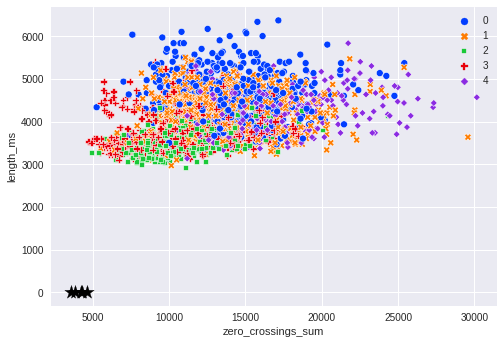

In [ ]:
sns.scatterplot(data=df, x="zero_crossings_sum", y="length_ms", hue=kmeans.labels_, style=kmeans.labels_,
                palette="bright")
plt.legend()
plt.scatter(centers[:,1], centers[:,0], c='black', marker='*', s=200)
plt.show()

In [ ]:
df.columns

Index(['frame_width', 'length_ms', 'zero_crossings_sum', 'mfcc_mean',
       'mfcc_std', 'mfcc_min', 'mfcc_max', 'sc_mean', 'sc_std', 'sc_min',
       'sc_max', 'sc_kur', 'sc_skew', 'stft_mean', 'stft_std', 'stft_min',
       'stft_kur', 'stft_skew', 'mean', 'std', 'min', 'max', 'kur', 'skew'],
      dtype='object')

In [ ]:

statistiche_audio1 = ['length_ms', 'zero_crossings_sum','min','max']
statistiche_audio4 = ['length_ms', 'zero_crossings_sum','stft_min','stft_mean']
statistiche_audio3 = ['length_ms', 'zero_crossings_sum','sc_min','sc_max']



Test effettuato sulle features:
['length_ms', 'zero_crossings_sum', 'min', 'max']


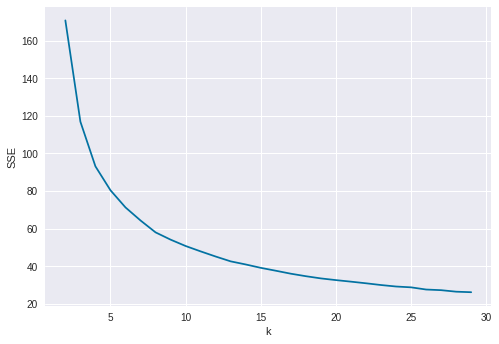

8
***************************************
k = 2| SSE = 170.88197454557465| silhouette = 0.5249882186787481|bauldin = 0.8531381343050161
k = 3| SSE = 116.93401046543849| silhouette = 0.3601179772707396|bauldin = 0.9919902561465518
k = 4| SSE = 93.14225223516432| silhouette = 0.36264327368255006|bauldin = 1.0037812925891334
k = 5| SSE = 80.41521993038563| silhouette = 0.33349170526517796|bauldin = 1.1095327002179882
k = 6| SSE = 71.26980003957726| silhouette = 0.301047079948422|bauldin = 1.092460242413305
k = 7| SSE = 64.31881110996754| silhouette = 0.30612374031944334|bauldin = 1.0583330116610006
k = 8| SSE = 57.984961423376404| silhouette = 0.3039551930775133|bauldin = 1.0477491773800423
k = 9| SSE = 54.110303215678464| silhouette = 0.28473992671549414|bauldin = 1.0689712126561164
k = 10| SSE = 50.71893640016209| silhouette = 0.27244773097405844|bauldin = 1.0493207290789988
k = 11| SSE = 47.85554093336984| silhouette = 0.2880075382323562|bauldin = 1.0508204921323847
k = 12| SSE = 45.11

In [ ]:
sse, silhouette, kl,bauldin = res_K_minMax(df, statistiche_audio1)
for i in range(2, 30):
    print("k = " + str(i) + "| SSE = " + str(sse[i]) + "| silhouette = " + str(silhouette[i])+"|bauldin = " + str(bauldin[i]))
print(kl)

In [ ]:
scaler = MinMaxScaler()#Normalizing using the standard scaler
scaler.fit(df[statistiche_audio1])
X_scal = scaler.transform(df[statistiche_audio1])


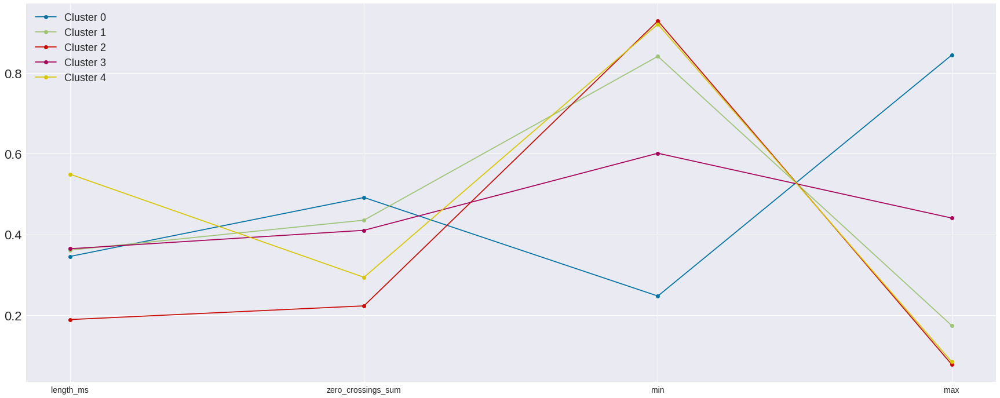

In [ ]:
parallel_plot(5,X_scal,statistiche_audio1)

In [ ]:
df.columns

Index(['frame_width', 'length_ms', 'zero_crossings_sum', 'mfcc_mean',
       'mfcc_std', 'mfcc_min', 'mfcc_max', 'sc_mean', 'sc_std', 'sc_min',
       'sc_max', 'sc_kur', 'sc_skew', 'stft_mean', 'stft_std', 'stft_min',
       'stft_kur', 'stft_skew', 'mean', 'std', 'min', 'max', 'kur', 'skew'],
      dtype='object')

In [ ]:
scaler = MinMaxScaler()#Normalizing using the standard scaler
scaler.fit(df[statistiche_audio3])
X_scal = scaler.transform(df[statistiche_audio3])

Test effettuato sulle features:
['length_ms', 'zero_crossings_sum', 'sc_min', 'sc_max']


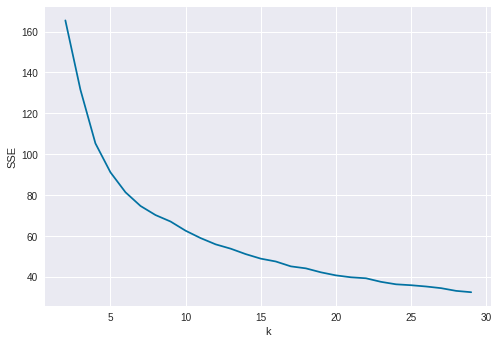

7
***************************************
k = 2| SSE = 165.45992460023092| silhouette = 0.41379629588662653|bauldin = 1.0264190542632592
k = 3| SSE = 131.63718986586207| silhouette = 0.357606785108061|bauldin = 1.1575714113453301
k = 4| SSE = 105.34621884233178| silhouette = 0.33100556960293|bauldin = 1.1590513747742877
k = 5| SSE = 91.19298380421387| silhouette = 0.3310866192412164|bauldin = 1.1590212949902703
k = 6| SSE = 81.44293861813209| silhouette = 0.31029702494475364|bauldin = 1.1248342373672064
k = 7| SSE = 74.7516008374945| silhouette = 0.29787176152598743|bauldin = 1.172277243479335
k = 8| SSE = 70.30270815774139| silhouette = 0.3035987727995366|bauldin = 1.138525118047811
k = 9| SSE = 67.14177964437582| silhouette = 0.27218190645244533|bauldin = 1.2394480234007363
k = 10| SSE = 62.65249962565217| silhouette = 0.2746604095972248|bauldin = 1.1773214170894664
k = 11| SSE = 59.04220993757836| silhouette = 0.2714446474021256|bauldin = 1.1260366015656695
k = 12| SSE = 55.98532205

In [ ]:
sse, silhouette, kl,bauldin = res_K_minMax(df, statistiche_audio3)
for i in range(2, 30):
    print("k = " + str(i) + "| SSE = " + str(sse[i]) + "| silhouette = " + str(silhouette[i])+"|bauldin = " + str(bauldin[i]))
print(kl)

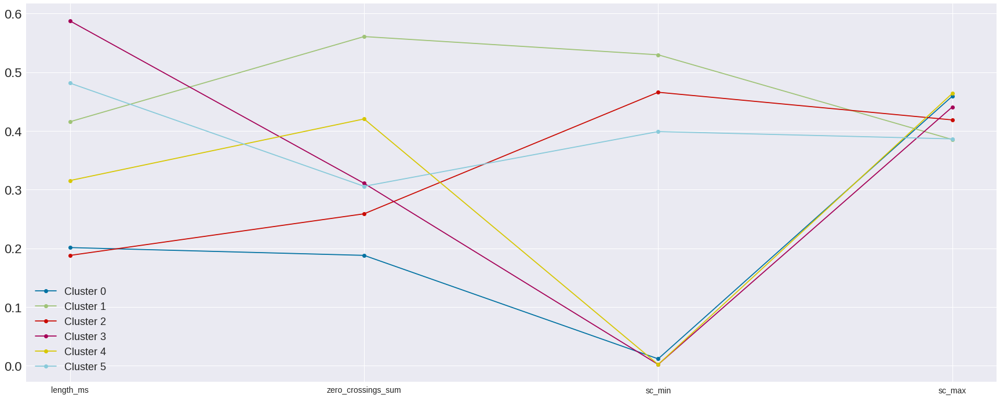

In [ ]:
parallel_plot(6,X_scal,statistiche_audio3)

In [ ]:
scaler = MinMaxScaler()#Normalizing using the standard scaler
scaler.fit(df[statistiche_audio4])
X_scal = scaler.transform(df[statistiche_audio4])

Test effettuato sulle features:
['length_ms', 'zero_crossings_sum', 'stft_min', 'stft_mean']


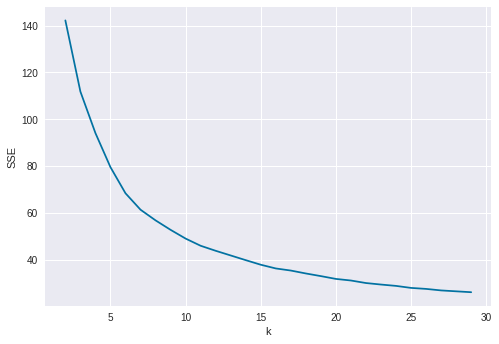

8
***************************************
k = 2| SSE = 142.26326356448382| silhouette = 0.32123087245415405|bauldin = 1.1728264879319281
k = 3| SSE = 111.83657086121276| silhouette = 0.27173965059812805|bauldin = 1.2417528887543503
k = 4| SSE = 94.08995280000138| silhouette = 0.2773928498517891|bauldin = 1.172378415314237
k = 5| SSE = 79.51248032633276| silhouette = 0.26219676478269693|bauldin = 1.1476330337576233
k = 6| SSE = 68.35189755740707| silhouette = 0.28229702262781964|bauldin = 1.0841681382865034
k = 7| SSE = 61.327236292061045| silhouette = 0.28861062270779037|bauldin = 1.0506197196429283
k = 8| SSE = 56.7684428340532| silhouette = 0.2872081426256205|bauldin = 1.0516832236804103
k = 9| SSE = 52.71816636175513| silhouette = 0.26017763588974696|bauldin = 1.0805769577623225
k = 10| SSE = 48.98004404140089| silhouette = 0.2550576170914825|bauldin = 1.1093407125125971
k = 11| SSE = 45.908987144065165| silhouette = 0.24829704562751634|bauldin = 1.1219312864051625
k = 12| SSE = 43.

In [ ]:
sse, silhouette, kl,bauldin = res_K_minMax(df, statistiche_audio4)
for i in range(2, 30):
    print("k = " + str(i) + "| SSE = " + str(sse[i]) + "| silhouette = " + str(silhouette[i])+"|bauldin = " + str(bauldin[i]))
print(kl)

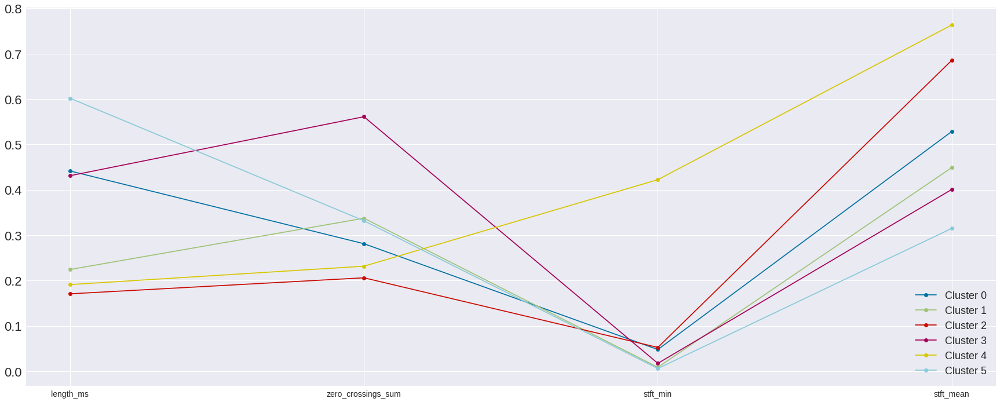

In [ ]:
parallel_plot(6,X_scal,statistiche_audio4)

Analisi sul sottoinsieme scelto definitivamente

Test effettuato sulle features:
['length_ms', 'zero_crossings_sum', 'mfcc_min', 'mfcc_max', 'mfcc_mean']


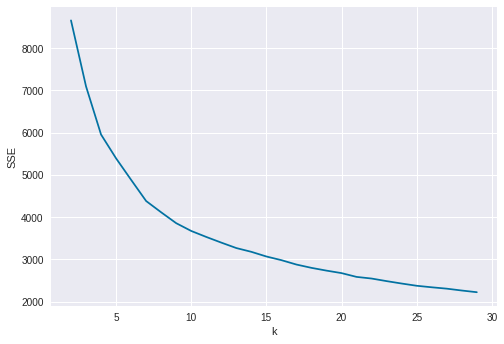

9
***************************************
k = 2| SSE = 8658.345124577836| silhouette = 0.2611310791032495|bauldin = 1.4546399796183014
k = 3| SSE = 7097.25011161084| silhouette = 0.2555771655379728|bauldin = 1.3432265172716216
k = 4| SSE = 5956.649369330108| silhouette = 0.241152973108783|bauldin = 1.3084794141719993
k = 5| SSE = 5392.583517585024| silhouette = 0.22374876372646277|bauldin = 1.3596808414698491
k = 6| SSE = 4884.256240813271| silhouette = 0.21399273901270674|bauldin = 1.4011447084557869
k = 7| SSE = 4382.674593148439| silhouette = 0.22984080934575857|bauldin = 1.2529340838766785
k = 8| SSE = 4115.771671288498| silhouette = 0.21901361332764951|bauldin = 1.2880282205095193
k = 9| SSE = 3858.398959120498| silhouette = 0.220607618894095|bauldin = 1.2561812849780425
k = 10| SSE = 3674.1779314400146| silhouette = 0.2083601632341514|bauldin = 1.2768978209356137
k = 11| SSE = 3532.6814217736483| silhouette = 0.202005034703969|bauldin = 1.3184221438723773
k = 12| SSE = 3398.48005

In [ ]:
sse, silhouette, kl,bauldin = res_K_Standard(df, statistiche_audio)
for i in range(2, 30):
    print("k = " + str(i) + "| SSE = " + str(sse[i]) + "| silhouette = " + str(silhouette[i])+"|bauldin = " + str(bauldin[i]))
print(kl)

In [ ]:
scaler = StandardScaler()#Normalizing using the Standard scaler
scaler.fit(df[statistiche_audio])
X_scal = scaler.transform(df[statistiche_audio])

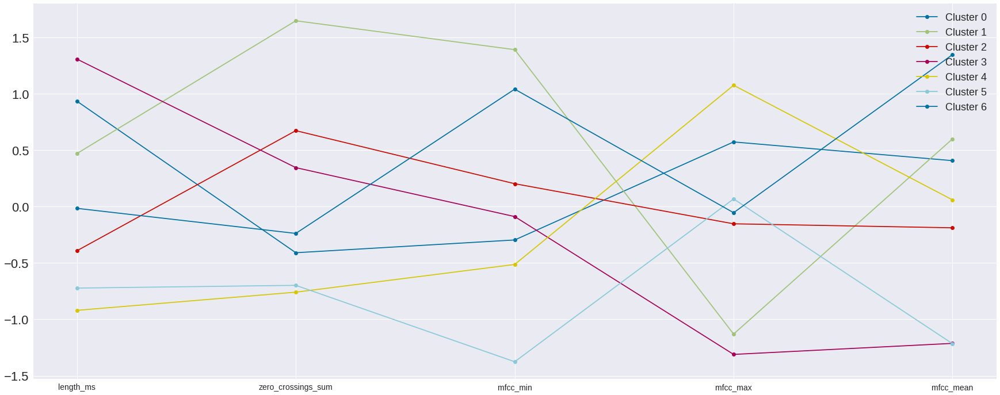

In [ ]:
parallel_plot(7,X_scal,statistiche_audio)

Test effettuato sulle features:
['length_ms', 'zero_crossings_sum', 'mfcc_min', 'mfcc_max', 'mfcc_mean']


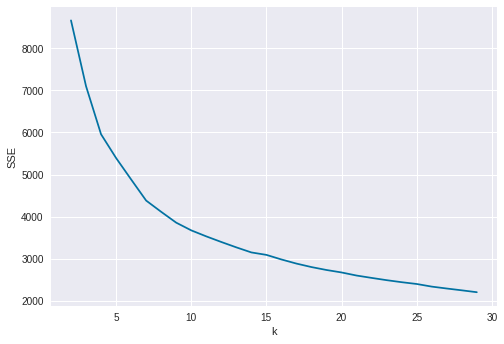

9
***************************************
k = 2| SSE = 8658.526686798225| silhouette = 0.2612897777693406|bauldin = 1.455049779152322
k = 3| SSE = 7098.316854984949| silhouette = 0.25696263520711643|bauldin = 1.3347288177366572
k = 4| SSE = 5956.563591291568| silhouette = 0.2413504439353381|bauldin = 1.3079765771566
k = 5| SSE = 5392.583517585024| silhouette = 0.22374876372646277|bauldin = 1.359680841469849
k = 6| SSE = 4884.447169662761| silhouette = 0.2140054404516343|bauldin = 1.4019942725712367
k = 7| SSE = 4382.6575505312885| silhouette = 0.22972885197082665|bauldin = 1.2526541727164313
k = 8| SSE = 4115.691551114402| silhouette = 0.21833608351341507|bauldin = 1.2896245934796036
k = 9| SSE = 3858.449866282354| silhouette = 0.22018926851891746|bauldin = 1.259930131190015
k = 10| SSE = 3675.7534325657043| silhouette = 0.20755525538816402|bauldin = 1.291529316189868
k = 11| SSE = 3532.9318099119514| silhouette = 0.20120711342372194|bauldin = 1.3282377026447276
k = 12| SSE = 3399.7990

In [ ]:
sse, silhouette, kl,bauldin = res_K_Standard(df, statistiche_audio)
for i in range(2, 30):
    print("k = " + str(i) + "| SSE = " + str(sse[i]) + "| silhouette = " + str(silhouette[i])+"|bauldin = " + str(bauldin[i]))
print(kl)

In [ ]:
scaler = MinMaxScaler()#Normalizing using the minMax scaler
scaler.fit(df[statistiche_audio])
X_scal = scaler.transform(df[statistiche_audio])

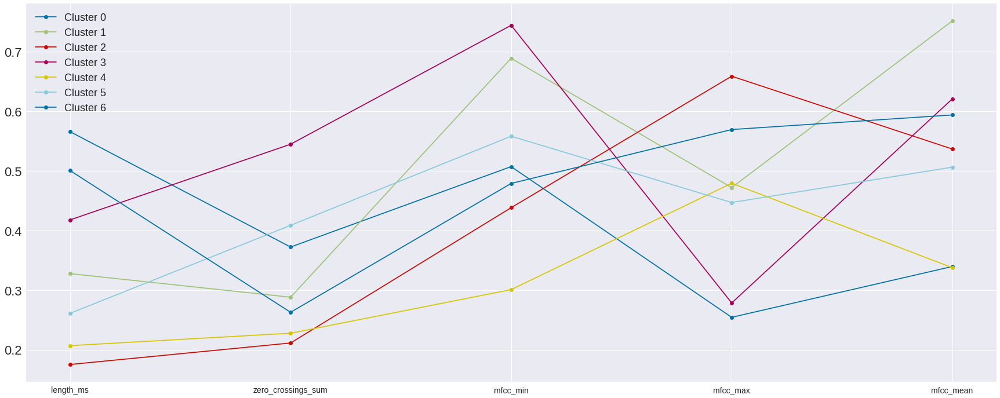

In [ ]:
parallel_plot(7,X_scal,statistiche_audio)

###. Cross tab

In [ ]:
scaler = StandardScaler()#Normalizing using the Standard scaler
scaler.fit(df[statistiche_audio])
X_scal = scaler.transform(df[statistiche_audio])
#centers = kmeans.cluster_centers_
#centers = scaler.inverse_transform(centers)

In [ ]:
df_clusters = ravdess_df.copy()
kmeans = KMeans( init="random", n_clusters=7, max_iter=1000).fit(X_scal)
df_clusters['Labels'] = kmeans.labels_

In [ ]:
np.unique(kmeans.labels_, return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6], dtype=int32),
 array([336, 283, 308, 500, 282, 388, 355]))

In [ ]:
cross_tab =  pd.crosstab(df_clusters['emotion'], df_clusters['Labels'])
cross_tab

Labels,0,1,2,3,4,5,6
emotion,,,,,,,
angry,132,114,2,33,8,66,21
calm,5,10,112,51,82,14,102
disgust,9,18,18,65,2,68,12
fearful,93,70,23,55,32,66,37
happy,68,48,19,81,45,57,58
neutral,2,4,38,57,39,10,38
sad,16,17,72,64,74,48,85
surprised,11,2,24,94,0,59,2


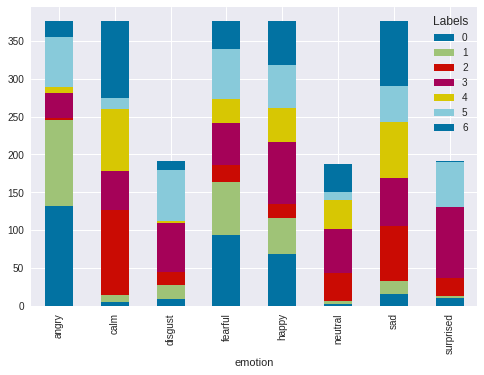

In [ ]:
cross_tab.plot(kind = 'bar', stacked =True)
plt.show()

In [ ]:
cross_tab =  pd.crosstab(df_clusters['emotional_intensity'], df_clusters['Labels'])
cross_tab

Labels,0,1,2,3,4,5,6
emotional_intensity,,,,,,,
normal,78,47,229,371,188,185,222
strong,258,236,79,129,94,203,133


In [ ]:
cross_tab =  pd.crosstab(df_clusters['vocal_channel'], df_clusters['Labels'])
cross_tab

Labels,0,1,2,3,4,5,6
vocal_channel,,,,,,,
song,169,157,12,13,278,68,321
speech,167,126,296,487,4,320,34


In [ ]:
cross_tab_s =  pd.crosstab(df_clusters['sex'], df_clusters['Labels'])
cross_tab_s

Labels,0,1,2,3,4,5,6
sex,,,,,,,
F,48,236,227,102,282,306,3
M,288,47,81,398,0,82,352


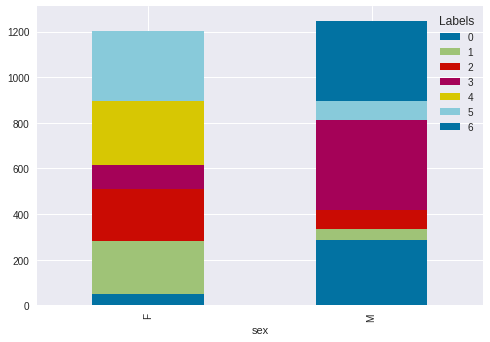

In [ ]:
cross_tab_s.plot(kind = 'bar', stacked =True)
plt.show()

In [ ]:
df_clusters.columns

Index(['vocal_channel', 'emotion', 'emotional_intensity', 'statement',
       'repetition', 'sex', 'frame_width', 'length_ms', 'zero_crossings_sum',
       'mfcc_mean', 'mfcc_std', 'mfcc_min', 'mfcc_max', 'sc_mean', 'sc_std',
       'sc_min', 'sc_max', 'sc_kur', 'sc_skew', 'stft_mean', 'stft_std',
       'stft_min', 'stft_kur', 'stft_skew', 'mean', 'std', 'min', 'max', 'kur',
       'skew', 'Labels'],
      dtype='object')

In [ ]:
cross_tab =  pd.crosstab(df_clusters['statement'], df_clusters['Labels'])
cross_tab

Labels,0,1,2,3,4,5,6
statement,,,,,,,
Dogs are sitting by the door,153,161,143,250,136,214,169
Kids are talking by the door,183,122,165,250,146,174,186


In [ ]:
cross_tab =  pd.crosstab(df_clusters['repetition'], df_clusters['Labels'])
cross_tab

Labels,0,1,2,3,4,5,6
repetition,,,,,,,
1st,173,142,157,245,141,193,175
2nd,163,141,151,255,141,195,180


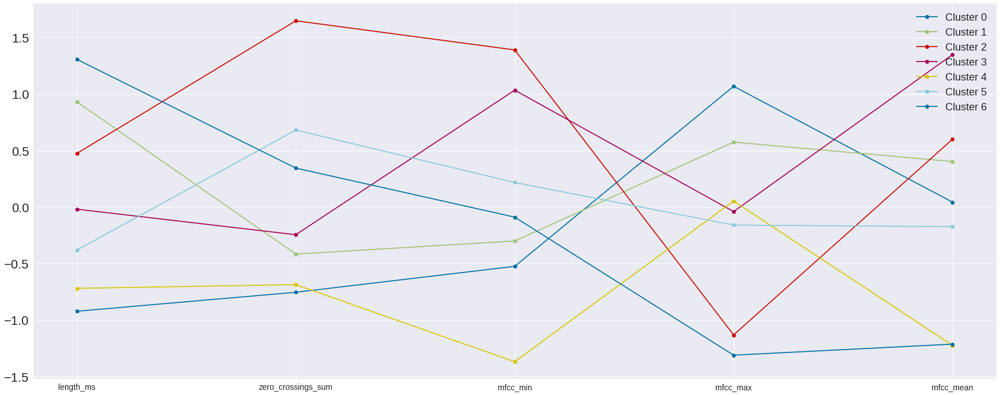

In [ ]:
parallel_plot(7,X_scal,statistiche_audio)

### Scatter plot

In [ ]:
scaler = StandardScaler()#Normalizing using the Standard scaler
scaler.fit(df[statistiche_audio])
X_scal = scaler.transform(df[statistiche_audio])
centers = kmeans.cluster_centers_
centers = scaler.inverse_transform(centers)

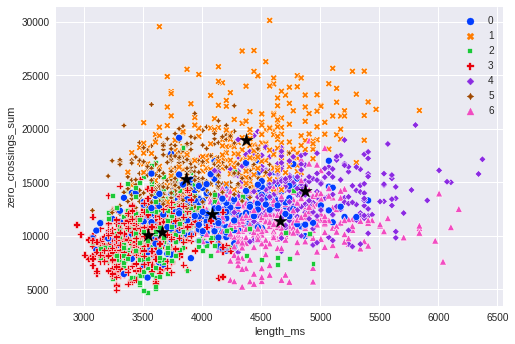

In [ ]:
sns.scatterplot(data=df_clusters, x="length_ms", y="zero_crossings_sum", hue='Labels', style='Labels',
                palette="bright")
plt.legend()
plt.scatter(centers[:,0], centers[:,1], c='black', marker='*', s=200)
plt.show()

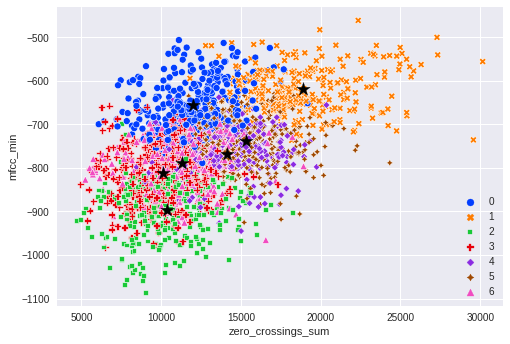

In [ ]:
sns.scatterplot(data=df_clusters, x="zero_crossings_sum", y="mfcc_min", hue='Labels', style='Labels',
                palette="bright")
plt.legend()
plt.scatter(centers[:,1], centers[:,2], c='black', marker='*', s=200)
plt.show()

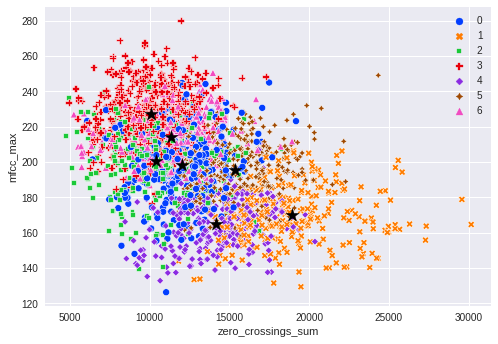

In [ ]:
sns.scatterplot(data=df_clusters, x="zero_crossings_sum", y="mfcc_max", hue='Labels', style='Labels',
                palette="bright")
plt.legend()
plt.scatter(centers[:,1], centers[:,3], c='black', marker='*', s=200)
plt.show()

### DBSCAN

Provo il primo sottoinsieme

In [ ]:
scaler = StandardScaler()#Normalizing using the standard scaler
scaler.fit(df[statistiche_audio])
X_scal = scaler.transform(df[statistiche_audio])

In [ ]:
dist = pdist(X_scal, 'euclidean')#calculate each distance
dist = squareform(dist)

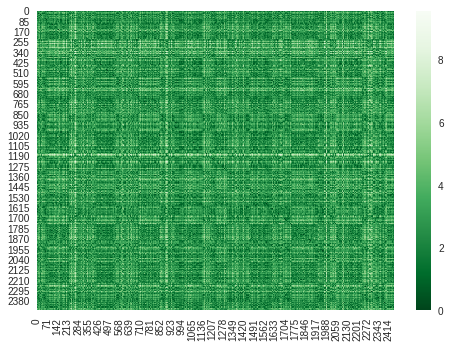

In [ ]:
sns.heatmap(dist, cmap="Greens_r", annot=False)
plt.show()

### Vedo fino a 60 k vicini

In [ ]:
k = 6
kth_distances6 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances6.append(d[index_kth_distance])

k = 12
kth_distances12 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances12.append(d[index_kth_distance])


k = 18
kth_distances18 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances18.append(d[index_kth_distance])


k = 24
kth_distances24 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances24.append(d[index_kth_distance])

k = 30
kth_distances30 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances30.append(d[index_kth_distance])


k = 36
kth_distances36 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances36.append(d[index_kth_distance])


k = 42
kth_distances42= []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances42.append(d[index_kth_distance])

k = 48
kth_distances48 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances48.append(d[index_kth_distance])


k = 54
kth_distances54 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances54.append(d[index_kth_distance])

k = 60
kth_distances60 = []
for d in dist:  # d is a vector containing distances between the ith record and all the others
    index_kth_distance = np.argsort(d)[k]  # take the index of the kth nearest neighbor
    kth_distances60.append(d[index_kth_distance])







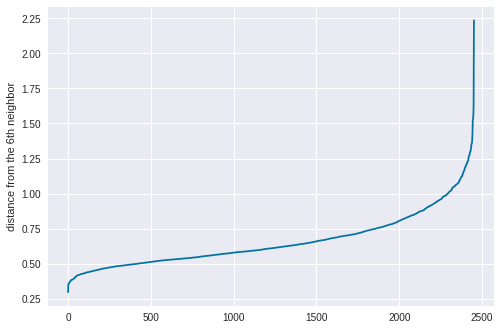

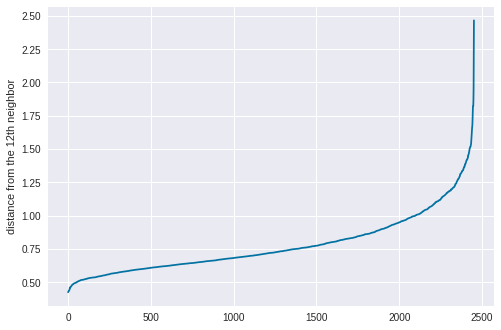

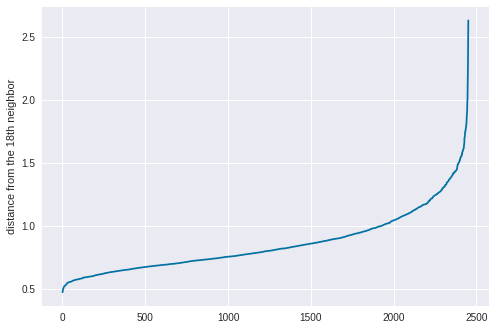

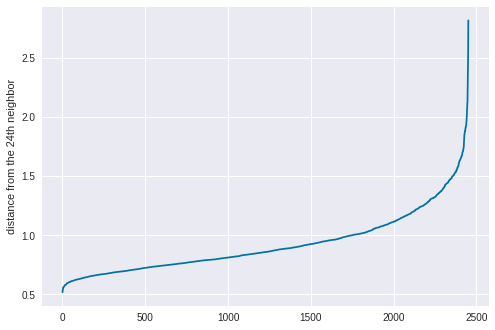

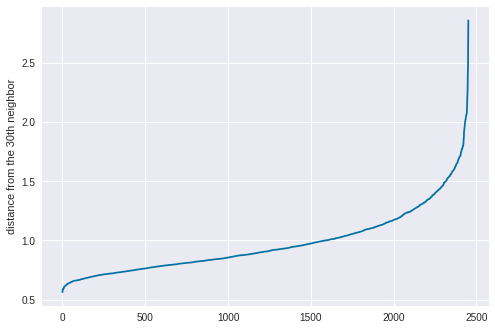

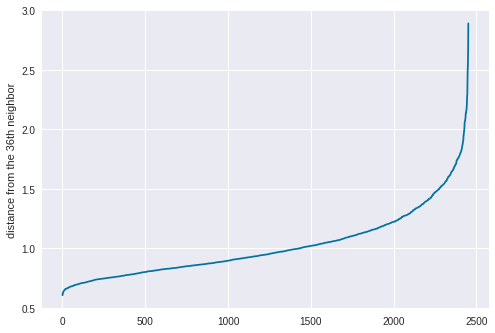

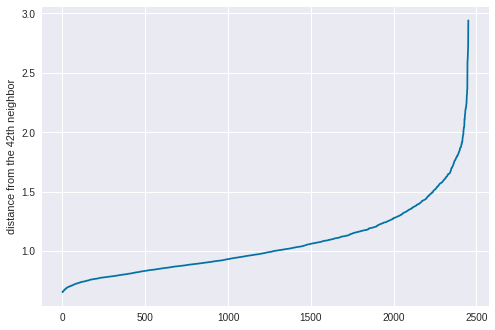

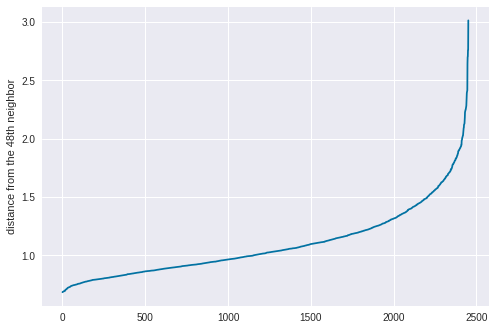

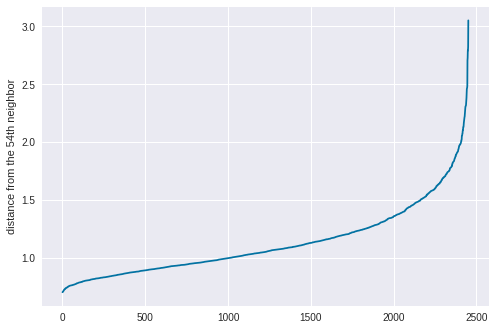

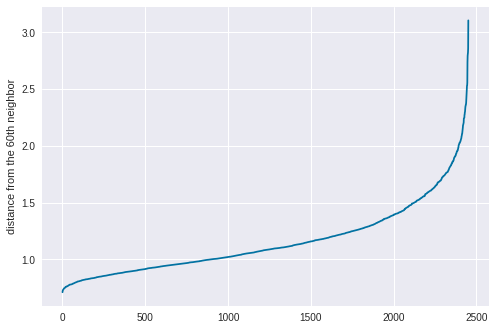

In [ ]:
plt.plot(range(0, len(kth_distances6)), sorted(kth_distances6))
plt.ylabel('distance from the {}th neighbor'.format(6))
#prendo il ginocchio, fare il for e vedere più combinazioni( 5, 10 , 15 , 20 , 100)
plt.show()

plt.plot(range(0, len(kth_distances12)), sorted(kth_distances12))
plt.ylabel('distance from the {}th neighbor'.format(12))
#prendo il ginocchio, fare il for e vedere più combinazioni( 5, 10 , 15 , 20 , 100)
plt.show()

plt.plot(range(0, len(kth_distances18)), sorted(kth_distances18))
plt.ylabel('distance from the {}th neighbor'.format(18))
#prendo il ginocchio, fare il for e vedere più combinazioni( 5, 10 , 15 , 20 , 100)
plt.show()


plt.plot(range(0, len(kth_distances24)), sorted(kth_distances24))
plt.ylabel('distance from the {}th neighbor'.format(24))
#prendo il ginocchio, fare il for e vedere più combinazioni( 5, 10 , 15 , 20 , 100)
plt.show()

plt.plot(range(0, len(kth_distances30)), sorted(kth_distances30))
plt.ylabel('distance from the {}th neighbor'.format(30))
#prendo il ginocchio, fare il for e vedere più combinazioni( 5, 10 , 15 , 20 , 100)
plt.show()

plt.plot(range(0, len(kth_distances36)), sorted(kth_distances36))
plt.ylabel('distance from the {}th neighbor'.format(36))
#prendo il ginocchio, fare il for e vedere più combinazioni( 5, 10 , 15 , 20 , 100)
plt.show()


plt.plot(range(0, len(kth_distances42)), sorted(kth_distances42))
plt.ylabel('distance from the {}th neighbor'.format(42))
#prendo il ginocchio, fare il for e vedere più combinazioni( 5, 10 , 15 , 20 , 100)
plt.show()


plt.plot(range(0, len(kth_distances48)), sorted(kth_distances48))
plt.ylabel('distance from the {}th neighbor'.format(48))
#prendo il ginocchio, fare il for e vedere più combinazioni( 5, 10 , 15 , 20 , 100)
plt.show()


plt.plot(range(0, len(kth_distances54)), sorted(kth_distances54))
plt.ylabel('distance from the {}th neighbor'.format(54))
#prendo il ginocchio, fare il for e vedere più combinazioni( 5, 10 , 15 , 20 , 100)
plt.show()


plt.plot(range(0, len(kth_distances60)), sorted(kth_distances60))
plt.ylabel('distance from the {}th neighbor'.format(60))
#prendo il ginocchio, fare il for e vedere più combinazioni( 5, 10 , 15 , 20 , 100)
plt.show()



In [ ]:
print('dbscan')
eps_to_try = [0.85,1.15,1.3,1.3,1.35,1.4,1.5,1.5,1.5,1.5]
for k in range(6,103,6):
  for e in eps_to_try:
    dbscan = DBSCAN(eps=e, min_samples=k, metric='euclidean')
    dbscan.fit(X_scal)
    hist, bins = np.histogram(dbscan.labels_, bins=range(-1, len(set(dbscan.labels_)) + 1))
    print('labels', dict(zip(bins, hist)))
    print('silhouette', silhouette_score(X_scal, dbscan.labels_))

dbscan
labels {-1: 90, 0: 2362, 1: 0}
silhouette 0.2535281978716986
labels {-1: 4, 0: 2448, 1: 0}
silhouette 0.33813975761302684
labels {-1: 3, 0: 2449, 1: 0}
silhouette 0.3517096160411357
labels {-1: 3, 0: 2449, 1: 0}
silhouette 0.3517096160411357
labels {-1: 3, 0: 2449, 1: 0}
silhouette 0.3517096160411357
labels {-1: 2, 0: 2450, 1: 0}
silhouette 0.3618521690021048
labels {-1: 1, 0: 2451, 1: 0}
silhouette 0.4020609678874514
labels {-1: 1, 0: 2451, 1: 0}
silhouette 0.4020609678874514
labels {-1: 1, 0: 2451, 1: 0}
silhouette 0.4020609678874514
labels {-1: 1, 0: 2451, 1: 0}
silhouette 0.4020609678874514
labels {-1: 235, 0: 2217, 1: 0}
silhouette 0.24976858643062316
labels {-1: 11, 0: 2441, 1: 0}
silhouette 0.3359461579612217
labels {-1: 3, 0: 2449, 1: 0}
silhouette 0.3517096160411357
labels {-1: 3, 0: 2449, 1: 0}
silhouette 0.3517096160411357
labels {-1: 3, 0: 2449, 1: 0}
silhouette 0.3517096160411357
labels {-1: 2, 0: 2450, 1: 0}
silhouette 0.3618521690021048
labels {-1: 1, 0: 2451, 1: 

In [ ]:
scaled_dataframe=pd.DataFrame(X_scal,columns=df[statistiche_audio].columns)
scaled_dataframe["LABEL"] = dbscan.labels_


sns.pairplot(scaled_dataframe, hue = "LABEL"); plt.show()

In [ ]:
scaled_dataframe.head()
scaled_dataframe = scaled_dataframe.drop(columns = ["LABEL"])

Adesso facciamo un nuovo test provando diverse combinazioni di epsilon=[0.1,2] e minPts=[6,102]

In [ ]:
eps_to_test = [round(eps,1) for eps in np.arange(0.1, 2, 0.1)]
min_samples_to_test = range(6, 103, 6)
#min_samples_to_test = range(5, 15, 1)

print("EPS:", eps_to_test)
print("MIN_SAMPLES:", list(min_samples_to_test))

scaled_dataframe=pd.DataFrame(X_scal,columns=df[statistiche_audio].columns)

EPS: [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.1, 1.2, 1.3, 1.4, 1.5, 1.6, 1.7, 1.8, 1.9]
MIN_SAMPLES: [6, 12, 18, 24, 30, 36, 42, 48, 54, 60, 66, 72, 78, 84, 90, 96, 102]


In [ ]:
from sklearn.neighbors import NearestNeighbors


def get_metrics(eps, min_samples, dataset, iter_):

    # Fitting ======================================================================

    dbscan_model_ = DBSCAN( eps = eps, min_samples = min_samples)
    dbscan_model_.fit(dataset)

    # Mean Noise Point Distance metric =============================================
    noise_indices = dbscan_model_.labels_ == -1

    if True in noise_indices:
        neighboors = NearestNeighbors(n_neighbors = 6).fit(dataset)
        distances, indices = neighboors.kneighbors(dataset)
        noise_distances = distances[noise_indices, 1:]
        noise_mean_distance = round(noise_distances.mean(), 3)
    else:
        noise_mean_distance = None

    # Number of found Clusters metric ==============================================

    number_of_clusters = len(set(dbscan_model_.labels_[dbscan_model_.labels_ >= 0]))

    # Log ==========================================================================

    print("%3d | Tested with eps = %3s and min_samples = %3s | %5s %4s" % (iter_, eps, min_samples, str(noise_mean_distance), number_of_clusters))

    return(noise_mean_distance, number_of_clusters)

In [ ]:
# Istanziamo i due dataframe che conterranno i risultati del grid search

# Dataframe per la metrica sulla distanza media dei noise points dai K punti più vicini
results_noise = pd.DataFrame(
    data = np.zeros((len(eps_to_test),len(min_samples_to_test))), # Empty dataframe
    columns = min_samples_to_test,
    index = eps_to_test
)

# Dataframe per la metrica sul numero di cluster
results_clusters = pd.DataFrame(
    data = np.zeros((len(eps_to_test),len(min_samples_to_test))), # Empty dataframe
    columns = min_samples_to_test,
    index = eps_to_test
)

In [ ]:
# ADESSO LANCIAMO IL GRID SEARCH

iter_ = 0

print("ITER| INFO%s |  DIST    CLUS" % (" "*39))
print("-"*65)

for eps in eps_to_test:
    for min_samples in min_samples_to_test:

        iter_ += 1

        # Calcolo le metriche
        noise_metric, cluster_metric = get_metrics(eps, min_samples, scaled_dataframe, iter_)

        # Inserisco i risultati nei relativi dataframe
        results_noise.loc[eps, min_samples] = noise_metric
        results_clusters.loc[eps, min_samples] = cluster_metric

ITER| INFO                                        |  DIST    CLUS
-----------------------------------------------------------------
  1 | Tested with eps = 0.1 and min_samples =   6 | 0.537    0
  2 | Tested with eps = 0.1 and min_samples =  12 | 0.537    0
  3 | Tested with eps = 0.1 and min_samples =  18 | 0.537    0
  4 | Tested with eps = 0.1 and min_samples =  24 | 0.537    0
  5 | Tested with eps = 0.1 and min_samples =  30 | 0.537    0
  6 | Tested with eps = 0.1 and min_samples =  36 | 0.537    0
  7 | Tested with eps = 0.1 and min_samples =  42 | 0.537    0
  8 | Tested with eps = 0.1 and min_samples =  48 | 0.537    0
  9 | Tested with eps = 0.1 and min_samples =  54 | 0.537    0
 10 | Tested with eps = 0.1 and min_samples =  60 | 0.537    0
 11 | Tested with eps = 0.1 and min_samples =  66 | 0.537    0
 12 | Tested with eps = 0.1 and min_samples =  72 | 0.537    0
 13 | Tested with eps = 0.1 and min_samples =  78 | 0.537    0
 14 | Tested with eps = 0.1 and min_samples =  84

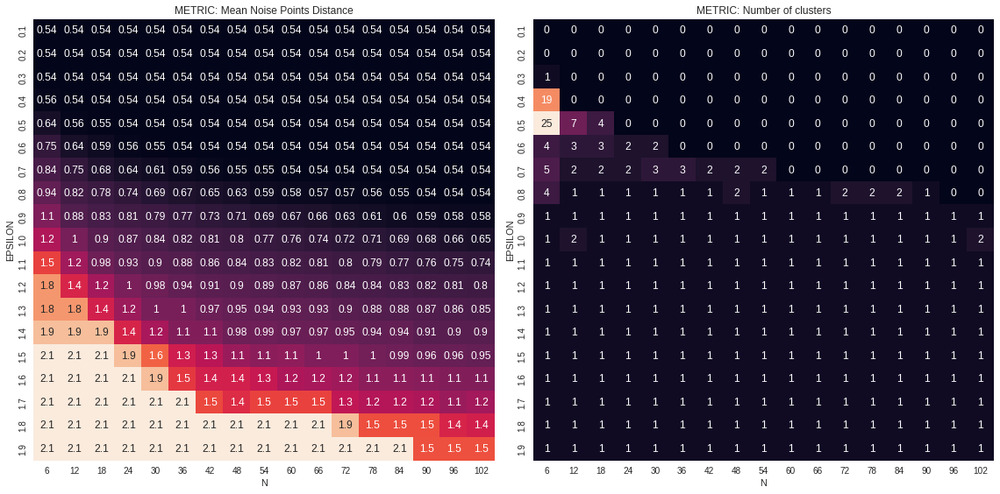

In [ ]:
# Mostriamo i risultati del grid search appena eseguito per cercare la "miglior" combinazione di iperparametri:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,8) )

sns.heatmap(results_noise, annot = True, ax = ax1, cbar = False).set_title("METRIC: Mean Noise Points Distance")
sns.heatmap(results_clusters, annot = True, ax = ax2, cbar = False).set_title("METRIC: Number of clusters")

ax1.set_xlabel("N"); ax2.set_xlabel("N")
ax1.set_ylabel("EPSILON"); ax2.set_ylabel("EPSILON")

plt.tight_layout(); plt.show()

OPZIONE 1

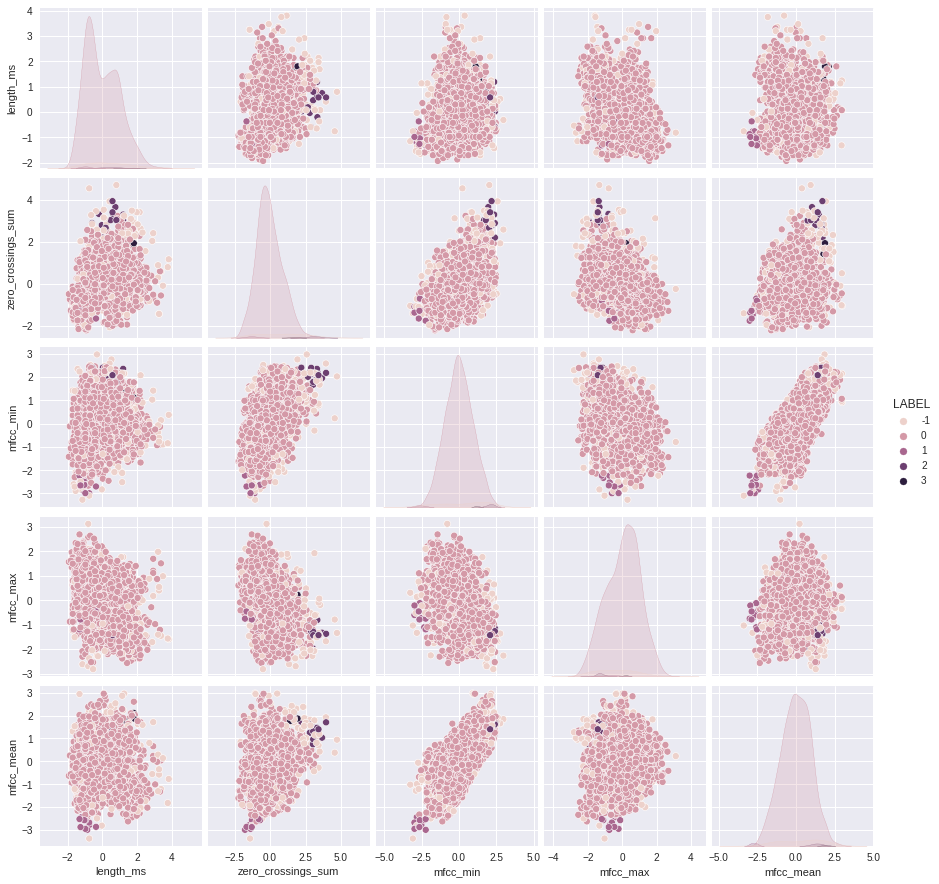

In [ ]:
best_dbscan_model = DBSCAN( eps =0.8, min_samples = 6)

# Fitting
best_dbscan_model.fit(scaled_dataframe)

# Extracting labels
scaled_dataframe["LABEL"] = best_dbscan_model.labels_

# Pairplot
sns.pairplot( scaled_dataframe, hue = "LABEL" ); plt.show()

In [ ]:
res_noise=best_dbscan_model.labels_[best_dbscan_model.labels_ == -1].size
res_0=best_dbscan_model.labels_[best_dbscan_model.labels_ == 0].size
res_1=best_dbscan_model.labels_[best_dbscan_model.labels_ == 1].size
res_2=best_dbscan_model.labels_[best_dbscan_model.labels_ == 2].size
res_3=best_dbscan_model.labels_[best_dbscan_model.labels_ == 3].size
sil=silhouette_score(X_scal, best_dbscan_model.labels_)
print(res_noise,res_0,res_1,res_2,res_3,sil)

#OPZIONE SCARTATA

143 2283 10 13 3 0.08415925131464537


OPZIONE 2

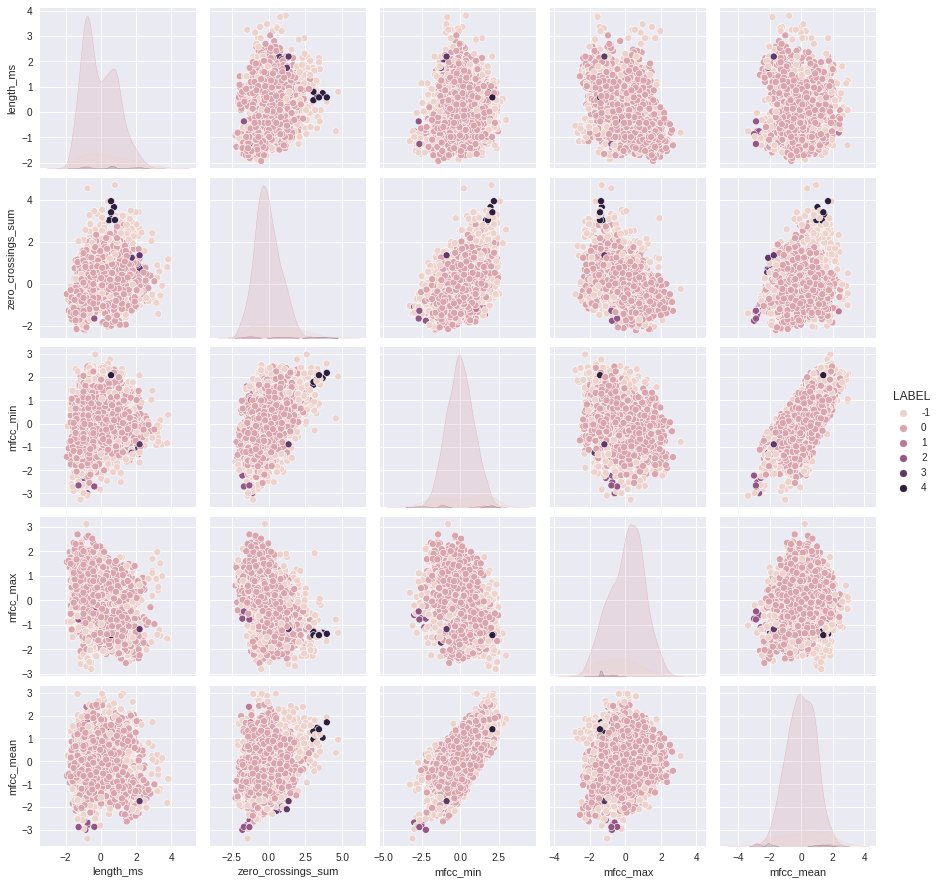

In [ ]:
best_dbscan_model = DBSCAN( eps =0.7, min_samples = 6)

# Fitting
best_dbscan_model.fit(scaled_dataframe)

# Extracting labels
scaled_dataframe["LABEL"] = best_dbscan_model.labels_

# Pairplot
sns.pairplot( scaled_dataframe, hue = "LABEL" ); plt.show()

In [ ]:
res_noise=best_dbscan_model.labels_[best_dbscan_model.labels_ == -1].size
res_0=best_dbscan_model.labels_[best_dbscan_model.labels_ == 0].size
res_1=best_dbscan_model.labels_[best_dbscan_model.labels_ == 1].size
res_2=best_dbscan_model.labels_[best_dbscan_model.labels_ == 2].size
res_3=best_dbscan_model.labels_[best_dbscan_model.labels_ == 3].size
res_4=best_dbscan_model.labels_[best_dbscan_model.labels_ == 4].size

sil=silhouette_score(X_scal, best_dbscan_model.labels_)
print(res_noise,res_0,res_1,res_2,res_3,res_4,sil)
#OPZIONE SCARTATA

326 2101 7 6 6 6 -0.01925538339040171


OPZIONE 3

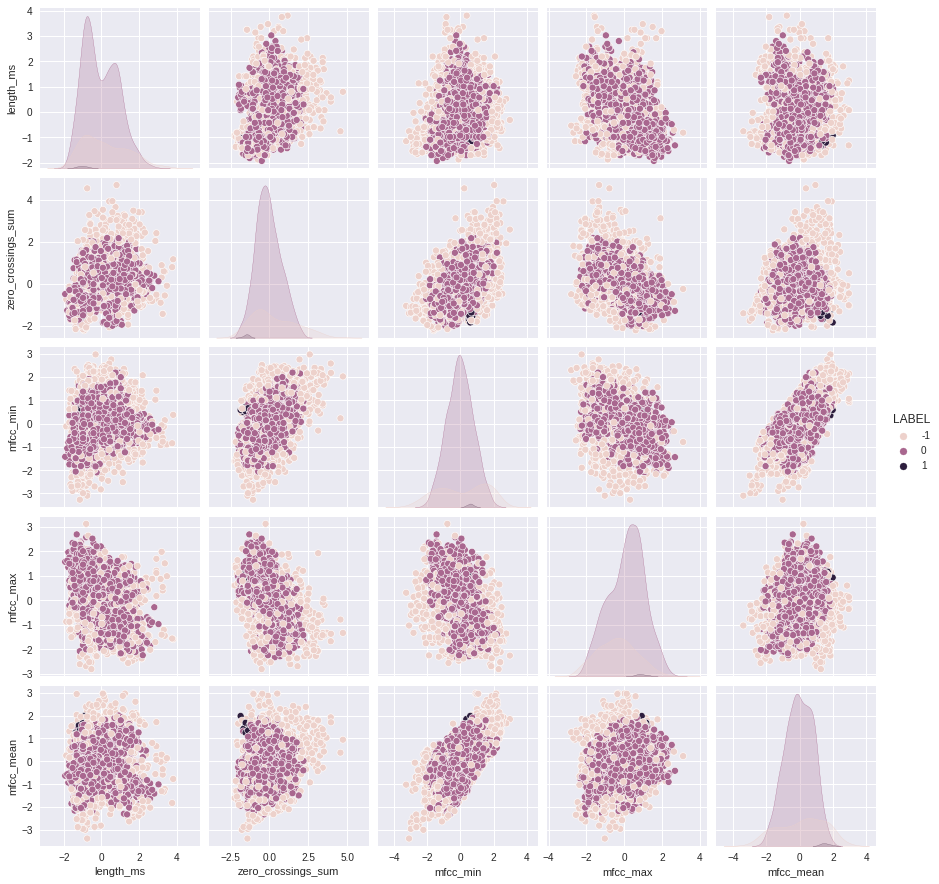

In [ ]:
best_dbscan_model = DBSCAN( eps =0.7, min_samples = 12)

# Fitting
best_dbscan_model.fit(scaled_dataframe)

# Extracting labels
scaled_dataframe["LABEL"] = best_dbscan_model.labels_

# Pairplot
sns.pairplot( scaled_dataframe, hue = "LABEL" ); plt.show()

In [ ]:
res_noise=best_dbscan_model.labels_[best_dbscan_model.labels_ == -1].size
res_0=best_dbscan_model.labels_[best_dbscan_model.labels_ == 0].size
res_1=best_dbscan_model.labels_[best_dbscan_model.labels_ == 1].size
sil=silhouette_score(X_scal, best_dbscan_model.labels_)
print(res_noise,res_0,res_1,sil)
#OPZIONE SCARTATA

573 1869 10 0.02072234501996153


OPZIONE 4

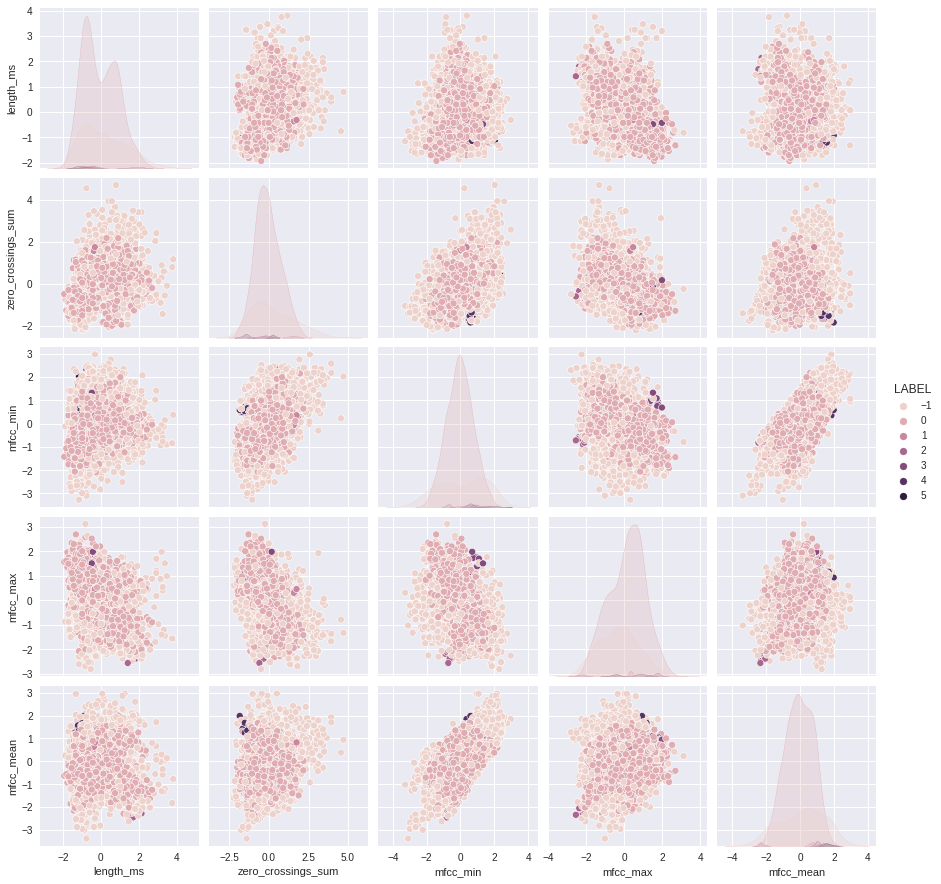

In [ ]:
best_dbscan_model = DBSCAN( eps =0.6, min_samples = 6)

# Fitting
best_dbscan_model.fit(scaled_dataframe)

# Extracting labels
scaled_dataframe["LABEL"] = best_dbscan_model.labels_

# Pairplot
sns.pairplot( scaled_dataframe, hue = "LABEL" ); plt.show()

### Clustering agglomerativo

In [ ]:
#Funzione per stampare i dendogrammi relativi ad un determinato modello

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)

Nessun cluster come paramentro provo con il  linkage complete

In [ ]:
X = df[statistiche_audio]
scaler = StandardScaler()
scaler.fit(X)
X_scal = scaler.transform(X)

In [ ]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean', linkage='complete')
model = model.fit(X_scal)

In [ ]:
pd.value_counts(model.labels_)

1491    1
764     1
922     1
902     1
867     1
       ..
1156    1
1790    1
1765    1
1817    1
0       1
Length: 2452, dtype: int64

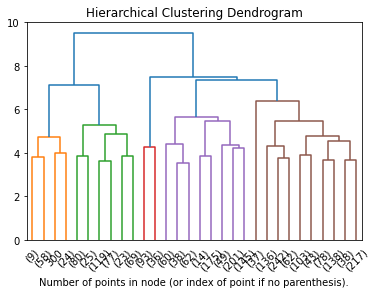

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

Secondo esperimento : nessun cluster come parametro , linkage = single

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean', linkage='single')
model = model.fit(X_scal)

In [ ]:
pd.value_counts(model.labels_)

1363    1
520     1
1317    1
665     1
747     1
       ..
666     1
1303    1
1249    1
1238    1
0       1
Length: 2452, dtype: int64

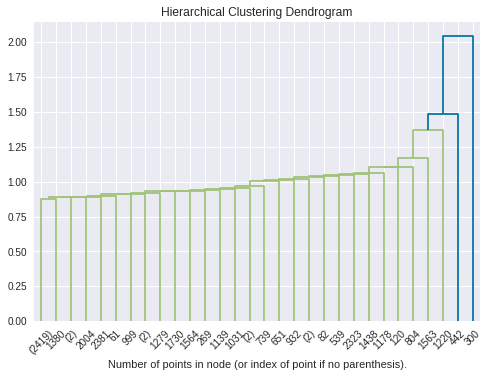

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()
#ORRENDO

Terzo esperimento : linkage = average

In [ ]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean', linkage='average')
model = model.fit(X_scal)

In [ ]:
pd.value_counts(model.labels_)

1350    1
1881    1
1016    1
1043    1
875     1
       ..
2039    1
1282    1
847     1
1766    1
0       1
Length: 2452, dtype: int64

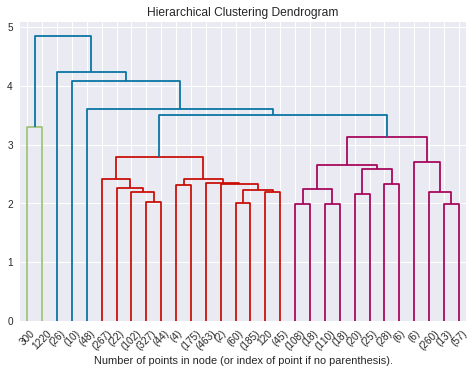

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

Linkage average provo con 4 cluster

In [ ]:
model = AgglomerativeClustering( n_clusters=4, affinity='euclidean', linkage='average')
model = model.fit(X_scal)
print(pd.value_counts(model.labels_))
print('silhouette', silhouette_score(X_scal, model.labels_))

0    2414
2      26
3      10
1       2
dtype: int64
silhouette 0.1341731880600798


Quarto esperimento: Provo con 4/5 cluster con linkage complete

In [ ]:
#Precalcolo matrice delle distanze

dist = pdist(X_scal, 'euclidean') # usiamo la distanza euclidea
dist = squareform(dist) #miglior formattazione della matrice

In [ ]:
model = AgglomerativeClustering(n_clusters=4, affinity='precomputed', linkage='complete')
model = model.fit(dist)

In [ ]:
print(pd.value_counts(model.labels_))
print('silhouette', silhouette_score(X_scal, model.labels_))

1    1094
3     744
0     485
2     129
dtype: int64
silhouette 0.13821918810697797


In [ ]:
model = AgglomerativeClustering(n_clusters=5, affinity='precomputed', linkage='complete')
model = model.fit(dist)
print(pd.value_counts(model.labels_))
print('silhouette', silhouette_score(X_scal, model.labels_))

0    1094
1     744
3     393
2     129
4      92
dtype: int64
silhouette 0.1280502254624842


Esperimento ward

In [ ]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean',
                                linkage='ward')
model = model.fit(X_scal)

In [ ]:
pd.value_counts(model.labels_)

1490    1
876     1
515     1
808     1
1663    1
       ..
923     1
1789    1
1764    1
1818    1
0       1
Length: 2452, dtype: int64

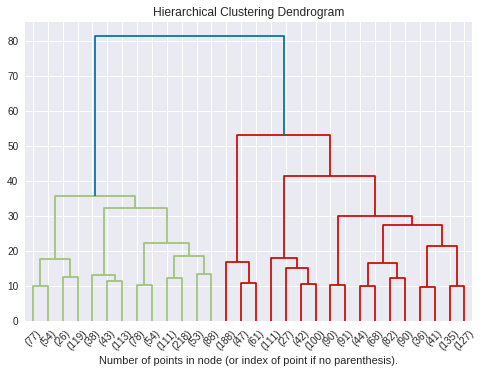

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

Provo con 2 , 3 e 4 ( e anche 5)

In [ ]:
model = AgglomerativeClustering(n_clusters=2, affinity='euclidean',
                                linkage='ward')
model = model.fit(X_scal)

In [ ]:
print(pd.value_counts(model.labels_))
print('silhouette', silhouette_score(X_scal, model.labels_))

0    1380
1    1072
dtype: int64
silhouette 0.23401594078221571


In [ ]:
model = AgglomerativeClustering(n_clusters=3, affinity='euclidean',
                                linkage='ward')
model = model.fit(X_scal)

In [ ]:
print(pd.value_counts(model.labels_))
print('silhouette', silhouette_score(X_scal, model.labels_))

0    1084
1    1072
2     296
dtype: int64
silhouette 0.220463500904117


In [ ]:
model = AgglomerativeClustering(n_clusters=4, affinity='euclidean',
                                linkage='ward')
model = model.fit(X_scal)

In [ ]:
print(pd.value_counts(model.labels_))
print('silhouette', silhouette_score(X_scal, model.labels_))

0    1072
1     804
2     296
3     280
dtype: int64
silhouette 0.1989309074948062


Esperimento ward + connectivity(neighbors=100)

In [ ]:
# hierarchical clustering
from sklearn.neighbors import kneighbors_graph


connectivity = kneighbors_graph(X_scal, n_neighbors=100, include_self=False)

In [ ]:
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean',
                                linkage='ward', connectivity=connectivity)
model = model.fit(X_scal)

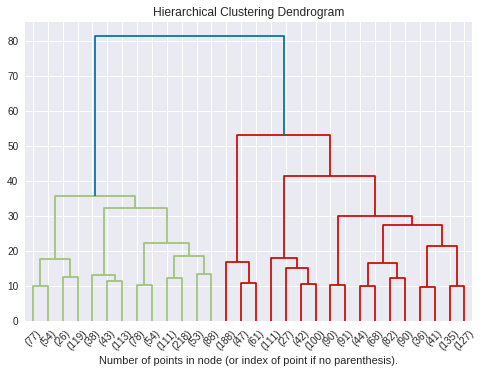

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [ ]:
model = AgglomerativeClustering(n_clusters=4, affinity='euclidean',
                                linkage='ward')
model = model.fit(X_scal)

In [ ]:
pd.value_counts(model.labels_)


0    1072
1     804
2     296
3     280
dtype: int64

In [ ]:
print('silhouette', silhouette_score(X_scal, model.labels_))

silhouette 0.1989309074948062


Esperimento complete + connectivity

In [ ]:
ward = AgglomerativeClustering(n_clusters=5, linkage='complete', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_scal, ward.labels_))

labels {0: 186, 1: 22, 2: 1, 3: 10, 4: 2233}
silhouette 0.11299385622414918


Esperimento average + connectivity

In [ ]:
ward = AgglomerativeClustering(n_clusters=4, linkage='average', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_scal, ward.labels_))

labels {0: 2449, 1: 1, 2: 1, 3: 1}
silhouette 0.2462028257053804


Esperimento ward + connectivity(neighbors=10)

In [ ]:
connectivity = kneighbors_graph(X_scal, n_neighbors=10, include_self=False)

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='euclidean',
                                linkage='ward', connectivity=connectivity)
model = model.fit(X_scal)

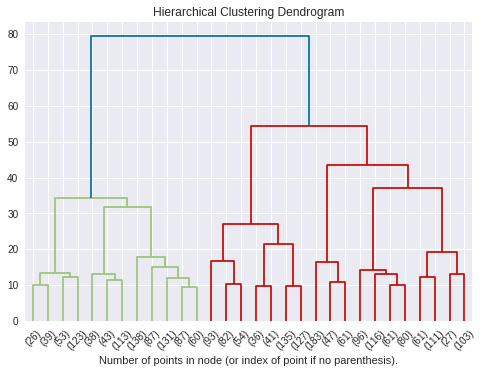

In [ ]:
plt.title("Hierarchical Clustering Dendrogram")
plot_dendrogram(model, truncate_mode="lastp")
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

In [ ]:
ward = AgglomerativeClustering(n_clusters=4, linkage='ward', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_scal, ward.labels_))

labels {0: 655, 1: 938, 2: 568, 3: 291}
silhouette 0.2069119208406437


Esperimento average + connectivity

In [ ]:
ward = AgglomerativeClustering(n_clusters=4, linkage='average', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_scal, ward.labels_))

labels {0: 2449, 1: 1, 2: 1, 3: 1}
silhouette 0.25646459567680013


Esperimento complete + connectivity

In [ ]:
ward = AgglomerativeClustering(n_clusters=3, linkage='complete', affinity='euclidean',
                                   connectivity=connectivity)
ward.fit(X_scal)

hist, bins = np.histogram(ward.labels_, bins=range(0, len(set(ward.labels_)) + 1))
print('labels', dict(zip(bins, hist)))
print('silhouette', silhouette_score(X_scal, ward.labels_))

labels {0: 2450, 1: 1, 2: 1}
silhouette 0.2903056425873036
